# Import librerie e dataset

In [1]:
import os
!pwd

os.chdir("RecSys_Course_AT_PoliMi")

!pwd


/Users/filippo/Documents/PoliMI/Recommender Systems/Challenge
/Users/filippo/Documents/PoliMI/Recommender Systems/Challenge/RecSys_Course_AT_PoliMi


In [2]:
import os
#os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'
import time 
import numpy as np
import pandas as pd
import scipy.sparse as sp
import scipy.sparse as sps
import matplotlib.pyplot as pyplot
%matplotlib inline
import tqdm
from tqdm import tqdm
import gc
from xgboost import XGBRanker
import scipy.stats as stats
from sklearn.model_selection import KFold
from scipy.sparse import csr_matrix
from numpy import linalg as LA
from Data_manager.split_functions.split_train_validation_random_holdout import split_train_in_two_percentage_global_sample
from skopt.space import Real, Integer, Categorical
from Evaluation.Evaluator import EvaluatorHoldout
from Recommenders.SLIM.SLIMElasticNetRecommender import SLIMElasticNetRecommender
from Recommenders.EASE_R.EASE_R_Recommender import EASE_R_Recommender

from Recommenders.MatrixFactorization.IALSRecommender import FeatureCombinedImplicitALSRecommender

from Recommenders.GraphBased.RP3betaRecommender import RP3betaRecommender
from Recommenders.GraphBased.P3alphaRecommender import P3alphaRecommender
from Recommenders.MatrixFactorization.PureSVDRecommender import ScaledPureSVDRecommender
from Recommenders.KNN.ItemKNNCFRecommender import ItemKNNCFRecommender

from Recommenders.XGBoost.XGBoostRerankerRecommender import XGBoostRerankerRecommender

#from Recommenders.hybrid.m2_model import IntegratedHierarchicalHybridRecommender
from Recommenders.hybrid.m3_model import TripleIntegratedHierarchicalHybridRecommender

from Recommenders.XGBoost.feature_populator import feature_populator

#from Recommenders.Neural.MultVAE_PyTorch_Recommender import MultVAERecommender_PyTorch
from Recommenders.Neural.MultVAE_PyTorch_Recommender import MultVAERecommender_PyTorch_OptimizerMask
import Recommenders.hybrid.MultVAEpatch
from Recommenders.hybrid.LinearHybridRecommender import NormalizedLinearCoupleHybridRecommender


In [3]:
df_train = pd.read_csv("data_train.csv")
df_test_user = pd.read_csv("data_target_users_test.csv")

In [4]:
from scipy.sparse import coo_matrix

#valore 1 per ogni coppia (row, col)
data = [1] * len(df_train)
df_train["row"] = df_train["row"].astype(int)
df_train["col"] = df_train["col"].astype(int)

# matrice COO
URM_all = sp.csr_matrix((data, (df_train["row"], df_train["col"])))


In [5]:
# Split dataset for train&val
URM_train_validation, URM_test = split_train_in_two_percentage_global_sample(URM_all, train_percentage = 0.8)

URM_train, URM_validation = split_train_in_two_percentage_global_sample(URM_train_validation, train_percentage = 0.8)

In [6]:
evaluator = EvaluatorHoldout(URM_test, cutoff_list=[20])

EvaluatorHoldout: Ignoring 29 ( 0.1%) Users that have less than 1 test interactions


In [ ]:
best_alpha= 0.15724832635414948
best_beta = 0.08802471282205815
best_gamma = 0.12728641243252908

IALS_Parameters = {
    'iterations': 135,
    'factors': 87,
    'alpha': 7.762338288061237,
    'regularization': 0.004799745261257595}

SLIMElastic_Parameters = {
    'topK': 625,
    'l1_ratio': 0.09517221375634205,
    'alpha': 0.00228698730766055
}

EASE_R_Parameters = {
    'topK': 1431,
    'l2_norm': 426.57622242296605}


RP3beta_Parameters = {
    'topK': 35,
    'alpha': 0.7733352330682174,
    'beta': 0.4139018623121251,
    'normalize_similarity': True
}

P3alpha_Parameters = {
    'topK': 91,
    'alpha': 0.10032229,
    'normalize_similarity': True
}

ScaledPureSVD_Parameters = {
    'num_factors' : 152,
    'scaling_items' : 0.000714,
    'scaling_users' : 0.575393
}

ItemKNNCF_Parameters = {
    'topK': 8,
    'shrink': 100,
    'tversky_alpha': 0.18445514996044549,
    'tversky_beta': 1.7490566752549062
}

MultVAE_params = {
    'learning_rate': 2.2956778160991473e-05,
    'l2_reg': 4.747958042741239e-05, 
    'encoding_size': 597,
    'next_layer_size_multiplier': 2.9916958009201124,
    'dropout': 0.4118674496820792, 
    'anneal_cap': 0.5969296800364489
}

MultVAE_IALS_params = {'alpha': 0.2133024147200015}

os.environ['KMP_DUPLICATE_LIB_OK']='True'
os.environ['MKL_NUM_THREADS']='1'
os.environ['OMP_NUM_THREADS']='1'

# Training hybrid su URM_Train

In [8]:
models_to_train = [
    (MultVAERecommender_PyTorch_OptimizerMask, MultVAE_params, "MultVAE"),
    (FeatureCombinedImplicitALSRecommender, IALS_Parameters, "IALS"),
    (SLIMElasticNetRecommender, SLIMElastic_Parameters, "SLIMElastic"),
    (EASE_R_Recommender, EASE_R_Parameters, "EASE_R"),
    (RP3betaRecommender, RP3beta_Parameters, "RP3beta"),
    (P3alphaRecommender, P3alpha_Parameters, "P3alpha"),
    (ScaledPureSVDRecommender, ScaledPureSVD_Parameters, "ScaledPureSVD"),
    (ItemKNNCFRecommender, ItemKNNCF_Parameters, "ItemKNNCF")
]

other_algorithms = {}

# Loop per trainare e valutare tutti i modelli
for model_class, params, name in models_to_train:
    print(f"--- Training {name} ---")
    
    current_recommender = model_class(URM_train)
    current_recommender.fit(**params)
    
    other_algorithms[name] = current_recommender
    
    print(f"Modello salvato in: other_algorithms['{name}']\n")

# Prova: Ibrido "coppia" tra MultVAE e iALS
"""multvae_ials_hybrid = NormalizedLinearCoupleHybridRecommender(
    URM_train, 
    [other_algorithms['MultVAE'], other_algorithms['IALS']]
)
multvae_ials_hybrid.fit(alpha=0.2133024147200015)"""

other_algorithms

--- Training MultVAE ---


/Users/filippo/Documents/PoliMI/Recommender Systems/Challenge/RecSys_Course_AT_PoliMi/Recommenders/hybrid/MultVAEpatch.py:17: UserWarning: Sparse CSR tensor support is in beta state. If you miss a functionality in the sparse tensor support, please submit a feature request to https://github.com/pytorch/pytorch/issues. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/SparseCsrTensorImpl.cpp:55.)
  user_batch_tensor = torch.sparse_csr_tensor(user_batch_tensor.indptr,


MultVAERecommender_PyTorch: Epoch 1 of 10. Elapsed time 9.95 sec
MultVAERecommender_PyTorch: Epoch 2 of 10. Elapsed time 19.66 sec
MultVAERecommender_PyTorch: Epoch 3 of 10. Elapsed time 29.01 sec
MultVAERecommender_PyTorch: Epoch 4 of 10. Elapsed time 38.10 sec
MultVAERecommender_PyTorch: Epoch 5 of 10. Elapsed time 47.12 sec
MultVAERecommender_PyTorch: Epoch 6 of 10. Elapsed time 57.34 sec
MultVAERecommender_PyTorch: Epoch 7 of 10. Elapsed time 1.11 min
MultVAERecommender_PyTorch: Epoch 8 of 10. Elapsed time 1.26 min
MultVAERecommender_PyTorch: Epoch 9 of 10. Elapsed time 1.41 min
MultVAERecommender_PyTorch: Epoch 10 of 10. Elapsed time 1.56 min
MultVAERecommender_PyTorch: Terminating at epoch 10. Elapsed time 1.57 min
Modello salvato in: other_algorithms['MultVAE']

--- Training IALS ---
Modello salvato in: other_algorithms['IALS']

--- Training SLIMElastic ---
SLIMElasticNetRecommender: Processed 6668 (95.7%) in 5.00 min. Items per second: 22.22
SLIMElasticNetRecommender: Processed

{'MultVAE': <Recommenders.Neural.MultVAE_PyTorch_Recommender.MultVAERecommender_PyTorch_OptimizerMask at 0x11659b4d0>,
 'IALS': <Recommenders.MatrixFactorization.IALSRecommender.FeatureCombinedImplicitALSRecommender at 0x11d00d160>,
 'SLIMElastic': <Recommenders.SLIM.SLIMElasticNetRecommender.SLIMElasticNetRecommender at 0x11d00d6a0>,
 'EASE_R': <Recommenders.EASE_R.EASE_R_Recommender.EASE_R_Recommender at 0x11d00de80>,
 'RP3beta': <Recommenders.GraphBased.RP3betaRecommender.RP3betaRecommender at 0x11d00d400>,
 'P3alpha': <Recommenders.GraphBased.P3alphaRecommender.P3alphaRecommender at 0x11d00d550>,
 'ScaledPureSVD': <Recommenders.MatrixFactorization.PureSVDRecommender.ScaledPureSVDRecommender at 0x11d00dfd0>,
 'ItemKNNCF': <Recommenders.KNN.ItemKNNCFRecommender.ItemKNNCFRecommender at 0x11d00e270>}

In [ ]:
"""multvae_ials_hybrid = NormalizedLinearCoupleHybridRecommender(
    URM_train, 
    [other_algorithms['MultVAE'], other_algorithms['IALS']]
)
multvae_ials_hybrid.fit(alpha=0.2133024147200015)"""

# 1. Crei e fitti l'ibrido coppia
# Assicurati di usare i modelli già presenti nel dizionario
other_algorithms['MultVAE_IALS'] = NormalizedLinearCoupleHybridRecommender(
    URM_train, 
    [other_algorithms['MultVAE'], other_algorithms['IALS']]
)
other_algorithms['MultVAE_IALS'].fit(alpha=0.2133024147200015)

# 3. Lo usi nella gerarchia chiamandolo dal dizionario
linear_comb_rec = TripleIntegratedHierarchicalHybridRecommender(
    URM_train,
    other_algorithms['SLIMElastic'],
    other_algorithms['EASE_R'],
    other_algorithms['RP3beta'],
    #other_algorithms['IALS']
    other_algorithms['MultVAE_IALS']
)

linear_comb_rec.fit(best_alpha, best_beta, best_gamma)

# Creazione training_dataframe (con label)

In [12]:
import importlib
import Recommenders.XGBoost.feature_populator

importlib.reload(Recommenders.XGBoost.feature_populator)
from Recommenders.XGBoost.feature_populator import feature_populator

training_dataframe = feature_populator(URM_train, linear_comb_rec, other_algorithms, cutoff = 50)

---------------1---------------
---------------2---------------


  0%|          | 0/27095 [00:00<?, ?it/s]

---------------3---------------


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/27095 [00:00<?, ?it/s]

  0%|          | 0/27095 [00:00<?, ?it/s]

  0%|          | 0/27095 [00:00<?, ?it/s]

  0%|          | 0/27095 [00:00<?, ?it/s]

  0%|          | 0/27095 [00:00<?, ?it/s]

  0%|          | 0/27095 [00:00<?, ?it/s]

  0%|          | 0/27095 [00:00<?, ?it/s]

  0%|          | 0/27095 [00:00<?, ?it/s]

  0%|          | 0/27095 [00:00<?, ?it/s]

--------------- Similarity Features (SLIM & RP3) ---------------
Processing SLIMElastic...


Users SLIMElastic:   0%|          | 0/27095 [00:00<?, ?it/s]

Processing RP3beta...


Users RP3beta:   0%|          | 0/27095 [00:00<?, ?it/s]

Processing ItemKNNCF...


Users ItemKNNCF:   0%|          | 0/27095 [00:00<?, ?it/s]

---------------6---------------
---------------7---------------
---------------new features by gemini---------------
--------------- ScaledPureSVD Embeddings ---------------
--------------- Score Ratios & Rank Differences ---------------
training dataframe creato con successo


In [13]:
URM_validation_coo = sps.coo_matrix(URM_validation)

correct_recommendations = pd.DataFrame({"UserID": URM_validation_coo.row,
                                        "ItemID": URM_validation_coo.col})

training_dataframe = pd.merge(training_dataframe, correct_recommendations, on=['UserID','ItemID'], how='left', indicator='Exist')
training_dataframe["Label"] = training_dataframe["Exist"] == "both"
training_dataframe.drop(columns = ['Exist'], inplace=True)
training_dataframe

,UserID,ItemID,MultVAE_Score,MultVAE_RankPosition,MultVAE_Recommended,IALS_Score,IALS_RankPosition,IALS_Recommended,SLIMElastic_Score,SLIMElastic_RankPosition,...,Diff_IALS_RP3beta,Ratio_ScaledPureSVD_SLIMElastic,Diff_ScaledPureSVD_SLIMElastic,Ratio_ScaledPureSVD_RP3beta,Diff_ScaledPureSVD_RP3beta,Ratio_IALS_ItemKNNCF,Diff_IALS_ItemKNNCF,Ratio_SLIMElastic_ItemKNNCF,Diff_SLIMElastic_ItemKNNCF,Label
0,0,3977,0.535442,163.0,0.0,0.816373,0.0,1.0,0.941306,0.0,...,-1.0,0.422205,1.0,0.472584,0.0,1.112458,-3.0,1.282702,-3.0,False
1,0,2194,0.332736,538.0,0.0,0.729627,1.0,1.0,0.858914,1.0,...,1.0,0.273897,27.0,0.235255,28.0,0.729628,1.0,0.858915,1.0,False
2,0,2399,0.765900,19.0,0.0,0.609956,5.0,1.0,0.545337,6.0,...,-4.0,0.432902,21.0,0.511556,18.0,1.513208,-36.0,1.352897,-35.0,False
3,0,6411,0.241977,797.0,0.0,0.527978,8.0,1.0,0.624941,2.0,...,4.0,0.370040,28.0,0.361486,26.0,0.640804,7.0,0.758486,1.0,False
4,0,596,0.697008,39.0,0.0,0.651364,3.0,1.0,0.289894,29.0,...,-1928.0,0.913705,-11.0,264878.191865,-1913.0,1.121708,-11.0,0.499224,15.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1354745,27094,5407,0.631135,43.0,0.0,0.615985,26.0,0.0,0.298384,99.0,...,-132.0,1.531782,-83.0,2.518197,-142.0,4.872217,-404.0,2.360118,-331.0,False
1354746,27094,797,0.197769,768.0,0.0,0.601110,30.0,0.0,0.380759,57.0,...,-447.0,1.061895,-26.0,4.336717,-446.0,2.485123,-141.0,1.574145,-114.0,False
1354747,27094,6073,0.510169,120.0,0.0,0.494297,87.0,0.0,0.435902,41.0,...,60.0,0.708549,28.0,0.781481,42.0,1.321084,24.0,1.165015,-22.0,True
1354748,27094,6805,0.218393,701.0,0.0,0.496930,85.0,0.0,0.454726,37.0,...,-19.0,1.124490,-29.0,2.204064,-96.0,1.768250,-43.0,1.618076,-91.0,False


# Creazione di XGBRanker (basato su URM_train)

In [14]:
groups = training_dataframe.groupby("UserID").size().values
groups

array([50, 50, 50, ..., 50, 50, 50], shape=(27095,))

In [15]:
training_dataframe

,UserID,ItemID,MultVAE_Score,MultVAE_RankPosition,MultVAE_Recommended,IALS_Score,IALS_RankPosition,IALS_Recommended,SLIMElastic_Score,SLIMElastic_RankPosition,...,Diff_IALS_RP3beta,Ratio_ScaledPureSVD_SLIMElastic,Diff_ScaledPureSVD_SLIMElastic,Ratio_ScaledPureSVD_RP3beta,Diff_ScaledPureSVD_RP3beta,Ratio_IALS_ItemKNNCF,Diff_IALS_ItemKNNCF,Ratio_SLIMElastic_ItemKNNCF,Diff_SLIMElastic_ItemKNNCF,Label
0,0,3977,0.535442,163.0,0.0,0.816373,0.0,1.0,0.941306,0.0,...,-1.0,0.422205,1.0,0.472584,0.0,1.112458,-3.0,1.282702,-3.0,False
1,0,2194,0.332736,538.0,0.0,0.729627,1.0,1.0,0.858914,1.0,...,1.0,0.273897,27.0,0.235255,28.0,0.729628,1.0,0.858915,1.0,False
2,0,2399,0.765900,19.0,0.0,0.609956,5.0,1.0,0.545337,6.0,...,-4.0,0.432902,21.0,0.511556,18.0,1.513208,-36.0,1.352897,-35.0,False
3,0,6411,0.241977,797.0,0.0,0.527978,8.0,1.0,0.624941,2.0,...,4.0,0.370040,28.0,0.361486,26.0,0.640804,7.0,0.758486,1.0,False
4,0,596,0.697008,39.0,0.0,0.651364,3.0,1.0,0.289894,29.0,...,-1928.0,0.913705,-11.0,264878.191865,-1913.0,1.121708,-11.0,0.499224,15.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1354745,27094,5407,0.631135,43.0,0.0,0.615985,26.0,0.0,0.298384,99.0,...,-132.0,1.531782,-83.0,2.518197,-142.0,4.872217,-404.0,2.360118,-331.0,False
1354746,27094,797,0.197769,768.0,0.0,0.601110,30.0,0.0,0.380759,57.0,...,-447.0,1.061895,-26.0,4.336717,-446.0,2.485123,-141.0,1.574145,-114.0,False
1354747,27094,6073,0.510169,120.0,0.0,0.494297,87.0,0.0,0.435902,41.0,...,60.0,0.708549,28.0,0.781481,42.0,1.321084,24.0,1.165015,-22.0,True
1354748,27094,6805,0.218393,701.0,0.0,0.496930,85.0,0.0,0.454726,37.0,...,-19.0,1.124490,-29.0,2.204064,-96.0,1.768250,-43.0,1.618076,-91.0,False


In [16]:
import gc # Garbage Collector interface

# 1. ASSICURARSI DELL'ORDINAMENTO (Cruciale per 'group')
# Sostituisci 'UserID' con la colonna che definisce i tuoi gruppi
#training_dataframe = training_dataframe.sort_values(by="UserID").reset_index(drop=True)

# 2. Creazione X e y
y_train = training_dataframe["Label"]
X_train = training_dataframe.drop(columns=["Label"])

# Conversione tipi (OK come int, ma attenzione se sono univoci)
X_train["UserID"] = X_train["UserID"].astype(int)
X_train["ItemID"] = X_train["ItemID"].astype(int)


# Training hybrid su URM_train_validation

In [19]:
other_algorithms_f = {}

MultVAE_IALS_params = {'alpha': 0.2133024147200015}     # RIMUOVI!!!

# Loop per trainare e valutare tutti i modelli
for model_class, params, name in models_to_train:
    print(f"--- Training {name} ---")
    
    current_recommender = model_class(URM_train_validation)
    current_recommender.fit(**params)
    
    other_algorithms_f[name] = current_recommender
    
    print(f"Modello salvato in: other_algorithms['{name}']\n")

other_algorithms_f['MultVAE_IALS'] = NormalizedLinearCoupleHybridRecommender(
    URM_train, 
    [other_algorithms_f['MultVAE'], other_algorithms_f['IALS']]
)
other_algorithms_f['MultVAE_IALS'].fit(alpha=0.2133024147200015)

other_algorithms_f

--- Training MultVAE ---
MultVAERecommender_PyTorch: Epoch 1 of 10. Elapsed time 9.04 sec
MultVAERecommender_PyTorch: Epoch 2 of 10. Elapsed time 18.36 sec
MultVAERecommender_PyTorch: Epoch 3 of 10. Elapsed time 28.41 sec
MultVAERecommender_PyTorch: Epoch 4 of 10. Elapsed time 38.11 sec
MultVAERecommender_PyTorch: Epoch 5 of 10. Elapsed time 48.46 sec
MultVAERecommender_PyTorch: Epoch 6 of 10. Elapsed time 57.51 sec
MultVAERecommender_PyTorch: Epoch 7 of 10. Elapsed time 1.11 min
MultVAERecommender_PyTorch: Epoch 8 of 10. Elapsed time 1.26 min
MultVAERecommender_PyTorch: Epoch 9 of 10. Elapsed time 1.41 min
MultVAERecommender_PyTorch: Epoch 10 of 10. Elapsed time 1.56 min
MultVAERecommender_PyTorch: Terminating at epoch 10. Elapsed time 1.56 min
Modello salvato in: other_algorithms['MultVAE']

--- Training IALS ---
Modello salvato in: other_algorithms['IALS']

--- Training SLIMElastic ---
SLIMElasticNetRecommender: Processed 4925 (70.7%) in 5.00 min. Items per second: 16.41
SLIMElastic

{'MultVAE': <Recommenders.Neural.MultVAE_PyTorch_Recommender.MultVAERecommender_PyTorch_OptimizerMask at 0x11cff2520>,
 'IALS': <Recommenders.MatrixFactorization.IALSRecommender.FeatureCombinedImplicitALSRecommender at 0x11029dcd0>,
 'SLIMElastic': <Recommenders.SLIM.SLIMElasticNetRecommender.SLIMElasticNetRecommender at 0x12458ead0>,
 'EASE_R': <Recommenders.EASE_R.EASE_R_Recommender.EASE_R_Recommender at 0x11cfea210>,
 'RP3beta': <Recommenders.GraphBased.RP3betaRecommender.RP3betaRecommender at 0x107339e50>,
 'P3alpha': <Recommenders.GraphBased.P3alphaRecommender.P3alphaRecommender at 0x11cfeb750>,
 'ScaledPureSVD': <Recommenders.MatrixFactorization.PureSVDRecommender.ScaledPureSVDRecommender at 0x11cfebd90>,
 'ItemKNNCF': <Recommenders.KNN.ItemKNNCFRecommender.ItemKNNCFRecommender at 0x127606490>,
 'MultVAE_IALS': <Recommenders.hybrid.LinearHybridRecommender.NormalizedLinearCoupleHybridRecommender at 0x127606850>}

In [20]:
linear_comb_rec_f = TripleIntegratedHierarchicalHybridRecommender(
    URM_train_validation, 
    other_algorithms_f['SLIMElastic'], 
    other_algorithms_f['EASE_R'], 
    other_algorithms_f['RP3beta'],
    #other_algorithms_f['IALS']
    other_algorithms_f['MultVAE_IALS'])
linear_comb_rec_f.fit(best_alpha, best_beta, best_gamma)

In [21]:
n_users, n_items = URM_train_validation.shape

validation_dataframe = pd.DataFrame(index=range(0,n_users), columns = ["ItemID"])
validation_dataframe.index.name='UserID'

# Creazione validation_dataframe

In [22]:
validation_dataframe = feature_populator(URM_train_validation, linear_comb_rec_f, other_algorithms_f, cutoff = 50)

---------------1---------------
---------------2---------------


  0%|          | 0/27095 [00:00<?, ?it/s]

---------------3---------------


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/27095 [00:00<?, ?it/s]

  0%|          | 0/27095 [00:00<?, ?it/s]

  0%|          | 0/27095 [00:00<?, ?it/s]

  0%|          | 0/27095 [00:00<?, ?it/s]

  0%|          | 0/27095 [00:00<?, ?it/s]

  0%|          | 0/27095 [00:00<?, ?it/s]

  0%|          | 0/27095 [00:00<?, ?it/s]

  0%|          | 0/27095 [00:00<?, ?it/s]

  0%|          | 0/27095 [00:00<?, ?it/s]

--------------- Similarity Features (SLIM & RP3) ---------------
Processing SLIMElastic...


Users SLIMElastic:   0%|          | 0/27095 [00:00<?, ?it/s]

Processing RP3beta...


Users RP3beta:   0%|          | 0/27095 [00:00<?, ?it/s]

Processing ItemKNNCF...


Users ItemKNNCF:   0%|          | 0/27095 [00:00<?, ?it/s]

---------------6---------------
---------------7---------------
---------------new features by gemini---------------
--------------- ScaledPureSVD Embeddings ---------------
--------------- Score Ratios & Rank Differences ---------------
training dataframe creato con successo


In [23]:
validation_dataframe

,UserID,ItemID,MultVAE_Score,MultVAE_RankPosition,MultVAE_Recommended,IALS_Score,IALS_RankPosition,IALS_Recommended,SLIMElastic_Score,SLIMElastic_RankPosition,...,Ratio_IALS_RP3beta,Diff_IALS_RP3beta,Ratio_ScaledPureSVD_SLIMElastic,Diff_ScaledPureSVD_SLIMElastic,Ratio_ScaledPureSVD_RP3beta,Diff_ScaledPureSVD_RP3beta,Ratio_IALS_ItemKNNCF,Diff_IALS_ItemKNNCF,Ratio_SLIMElastic_ItemKNNCF,Diff_SLIMElastic_ItemKNNCF
0,0,2194,0.337520,477.0,0.0,0.714834,0.0,1.0,0.890170,1.0,...,0.715199,-1.0,0.355244,13.0,0.316388,13.0,0.862235,-1.0,1.073724,0.0
1,0,3977,0.533684,143.0,0.0,0.665839,1.0,1.0,0.928240,0.0,...,0.665841,1.0,0.640463,0.0,0.594505,0.0,1.112828,-5.0,1.551383,-6.0
2,0,5532,0.842264,6.0,1.0,0.615161,2.0,1.0,0.641478,4.0,...,0.893024,-4.0,0.772345,-3.0,0.719230,-5.0,0.615162,2.0,0.641479,4.0
3,0,2399,0.740368,26.0,0.0,0.605889,3.0,1.0,0.466972,11.0,...,1.537236,-23.0,0.692580,1.0,0.820558,-14.0,1.864017,-44.0,1.436641,-36.0
4,0,6411,0.300096,589.0,0.0,0.520791,7.0,1.0,0.642571,3.0,...,0.752865,3.0,0.603489,2.0,0.560588,1.0,0.779270,5.0,0.961492,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1354745,27094,1930,0.383683,252.0,0.0,0.494607,123.0,0.0,0.512804,30.0,...,0.921259,119.0,0.789213,-4.0,0.753820,22.0,2.181738,-86.0,2.262008,-179.0
1354746,27094,3734,0.328509,370.0,0.0,0.530961,90.0,0.0,0.502580,31.0,...,2.281493,6.0,0.847608,-13.0,1.830447,-66.0,0.855292,82.0,0.809576,23.0
1354747,27094,4709,0.788270,11.0,0.0,0.465020,158.0,0.0,0.450479,43.0,...,1.399260,128.0,0.658281,41.0,0.892303,54.0,1.383153,66.0,1.339902,-49.0
1354748,27094,6805,0.167930,833.0,0.0,0.510433,110.0,0.0,0.490124,32.0,...,2.050730,42.0,0.921068,-19.0,1.813710,-55.0,1.576807,9.0,1.514071,-69.0


In [24]:
validation_dataframe["UserID"] = validation_dataframe["UserID"].astype(int)
validation_dataframe["ItemID"] = validation_dataframe["ItemID"].astype(int)

# Hyper-parameters tuning con optuna

In [25]:
from xgboost import XGBRanker

In [26]:
class XGBoostRerankerRecommender:
    def __init__(self, URM_train, XGB_model, df):
        self.URM_train = URM_train
        self.df = df
        self.XGB_model = XGB_model

    def recommend(self, user_ids, cutoff=20, return_scores=True, remove_seen_flag=True, remove_top_pop_flag=True, remove_custom_items_flag=False):
        recommendations = []
        for user_id in user_ids:
            # print(user_id)
            df_slice = self.df[self.df['UserID'] == user_id]
            items = df_slice.ItemID.to_numpy()
            preds = self.XGB_model.predict(df_slice)
            recommendations.append(items[np.argsort(preds)[-cutoff:][::-1]].tolist())
        
        if return_scores:
            rec, scores = other_algorithms_f['SLIMElastic'].recommend(user_ids, cutoff=cutoff, return_scores=return_scores)
            # useless scores
            return np.array(recommendations), scores
        
        return np.array(recommendations)

    def get_URM_train(self):
        return self.URM_train

In [27]:
def objective_xgboost(trial):

    XGB_model = XGBRanker(
        objective = 'rank:map',
        n_estimators = trial.suggest_int('n_estimators', 1000, 5000, log=True),
        learning_rate = trial.suggest_float('learning_rate', 1e-3, 0.01, log=True),
        reg_alpha = trial.suggest_float('reg_alpha', 1e-5, 1, log=True),
        reg_lambda = trial.suggest_float('reg_lambda', 1e-5, 1, log=True),
        max_depth = trial.suggest_int('max_depth', 3, 8),
        max_leaves = trial.suggest_int('max_leaves', 32, 850),
        grow_policy = trial.suggest_categorical('grow_policy', ['depthwise', 'lossguide']),
        verbosity = 2,
        booster = 'gbtree',
        # tree_method = trial.suggest_categorical('tree_method', ['exact', 'approx', 'hist']),
        tree_method = 'hist',
        gamma = trial.suggest_float('gamma', 1e-1, 12, log=True),
        min_child_weight = trial.suggest_float('min_child_weight', 1e-7, 2, log=True),
        subsample = trial.suggest_float('subsample', 0.2, 0.9),
        colsample_bytree = trial.suggest_float('colsample_bytree', 0.2, 0.9),
        # enable_categorical = True
    )

    XGB_model.fit(
        X_train,
        y_train,
        group=groups,
        verbose=True
    )


    # ---- FEATURE IMPORTANCE ----
    %matplotlib inline
    from xgboost import plot_importance

    import matplotlib.pyplot as plt
    fig, ax = plt.subplots(figsize=(10, 25))
    plot_importance(XGB_model, importance_type='weight', title='Weight (Frequence)', max_num_features=100, ax=ax)
    plt.show()

    import pandas as pd
    try:
        importance_dict = XGB_model.get_score(importance_type='weight')
    except AttributeError:
        importance_dict = XGB_model.get_booster().get_score(importance_type='weight')
    importance_df = pd.DataFrame({
        'Feature': list(importance_dict.keys()),
        'Importance': list(importance_dict.values())
    }).sort_values(by='Importance', ascending=False)
    with pd.option_context('display.max_rows', None):
        print(importance_df)
    # -------------

    recommender = XGBoostRerankerRecommender(URM_train_validation, XGB_model, validation_dataframe)
    result_df, _ = evaluator.evaluateRecommender(recommender)

    del recommender
    gc.collect()

    return result_df.loc[20, 'RECALL']

In [28]:
import optuna

[I 2025-12-30 19:39:23,970] A new study created in memory with name: xgboost_tuning_fixed_more_recommenders_more_candidates


[19:39:39] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


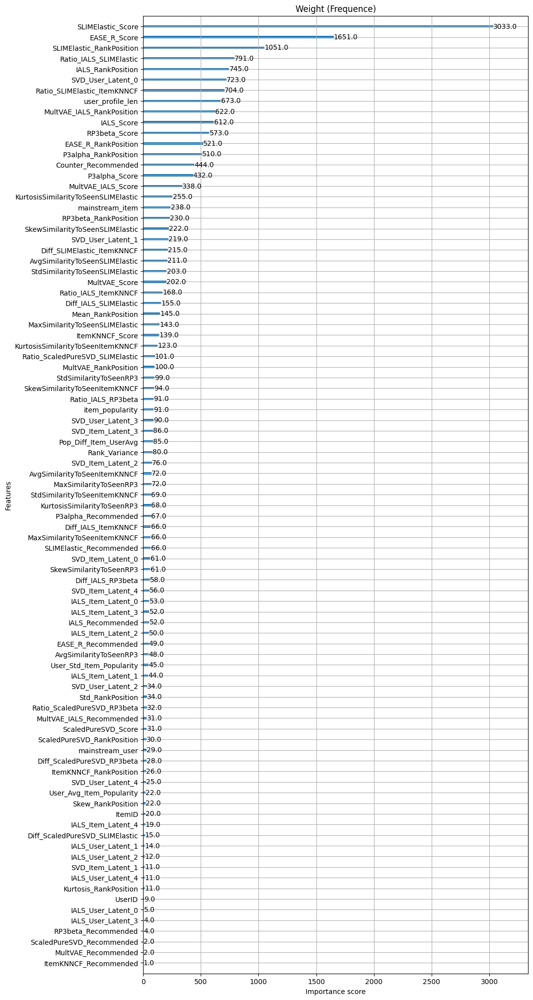

                                Feature  Importance
8                     SLIMElastic_Score      3033.0
11                         EASE_R_Score      1651.0
9              SLIMElastic_RankPosition      1051.0
77               Ratio_IALS_SLIMElastic       791.0
6                     IALS_RankPosition       745.0
67                    SVD_User_Latent_0       723.0
87          Ratio_SLIMElastic_ItemKNNCF       704.0
50                     user_profile_len       673.0
27            MultVAE_IALS_RankPosition       622.0
5                            IALS_Score       612.0
14                        RP3beta_Score       573.0
12                  EASE_R_RankPosition       521.0
18                 P3alpha_RankPosition       510.0
44                  Counter_Recommended       444.0
17                        P3alpha_Score       432.0
26                   MultVAE_IALS_Score       338.0
33  KurtosisSimilarityToSeenSLIMElastic       255.0
52                      mainstream_item       238.0
15          

[I 2025-12-30 19:54:52,001] Trial 0 finished with value: 0.2885595990324432 and parameters: {'n_estimators': 2416, 'learning_rate': 0.0019847327232725208, 'reg_alpha': 0.8205925040163752, 'reg_lambda': 0.2486880152723364, 'max_depth': 4, 'max_leaves': 309, 'grow_policy': 'depthwise', 'gamma': 8.2859147102141, 'min_child_weight': 1.5718729955303537e-07, 'subsample': 0.7365613689320665, 'colsample_bytree': 0.41341507743055644}. Best is trial 0 with value: 0.2885595990324432.


[19:55:01] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


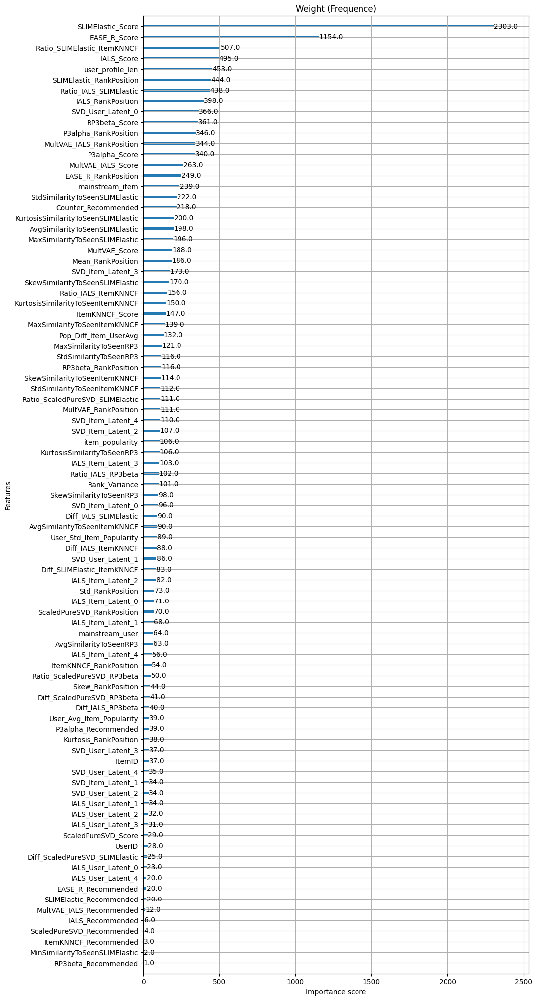

                                Feature  Importance
7                     SLIMElastic_Score      2303.0
10                         EASE_R_Score      1154.0
87          Ratio_SLIMElastic_ItemKNNCF       507.0
4                            IALS_Score       495.0
50                     user_profile_len       453.0
8              SLIMElastic_RankPosition       444.0
77               Ratio_IALS_SLIMElastic       438.0
5                     IALS_RankPosition       398.0
67                    SVD_User_Latent_0       366.0
13                        RP3beta_Score       361.0
17                 P3alpha_RankPosition       346.0
26            MultVAE_IALS_RankPosition       344.0
16                        P3alpha_Score       340.0
25                   MultVAE_IALS_Score       263.0
11                  EASE_R_RankPosition       249.0
52                      mainstream_item       239.0
31       StdSimilarityToSeenSLIMElastic       222.0
44                  Counter_Recommended       218.0
33  Kurtosis

[I 2025-12-30 20:07:45,388] Trial 1 finished with value: 0.28912579927858756 and parameters: {'n_estimators': 2113, 'learning_rate': 0.0044656510478002336, 'reg_alpha': 0.00043073738615238946, 'reg_lambda': 0.03598487139524432, 'max_depth': 3, 'max_leaves': 237, 'grow_policy': 'lossguide', 'gamma': 0.10203018099339309, 'min_child_weight': 0.00808199196585916, 'subsample': 0.7275590592403726, 'colsample_bytree': 0.48777005320477546}. Best is trial 1 with value: 0.28912579927858756.


[20:07:54] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


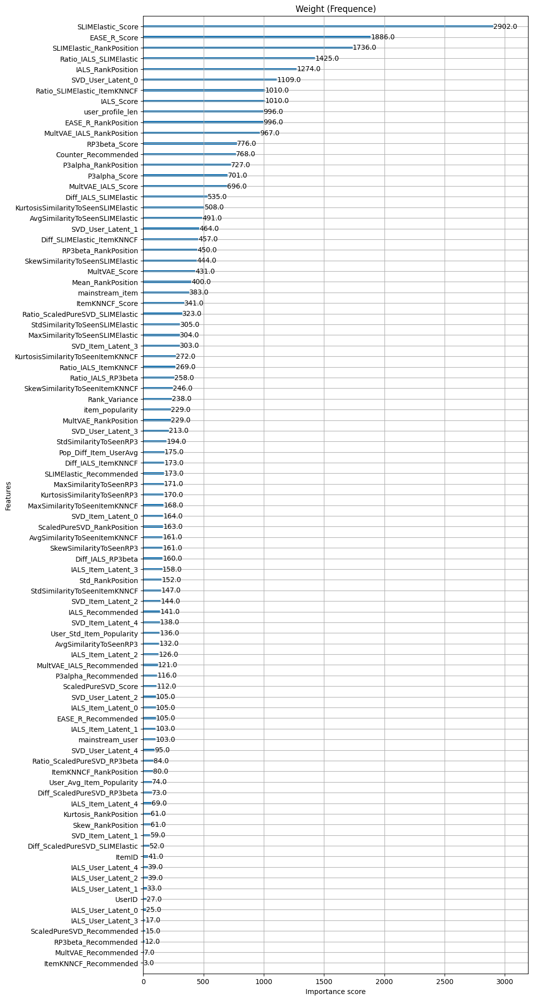

                                Feature  Importance
8                     SLIMElastic_Score      2902.0
11                         EASE_R_Score      1886.0
9              SLIMElastic_RankPosition      1736.0
77               Ratio_IALS_SLIMElastic      1425.0
6                     IALS_RankPosition      1274.0
67                    SVD_User_Latent_0      1109.0
87          Ratio_SLIMElastic_ItemKNNCF      1010.0
5                            IALS_Score      1010.0
50                     user_profile_len       996.0
12                  EASE_R_RankPosition       996.0
27            MultVAE_IALS_RankPosition       967.0
14                        RP3beta_Score       776.0
44                  Counter_Recommended       768.0
18                 P3alpha_RankPosition       727.0
17                        P3alpha_Score       701.0
26                   MultVAE_IALS_Score       696.0
78                Diff_IALS_SLIMElastic       535.0
33  KurtosisSimilarityToSeenSLIMElastic       508.0
29       Avg

[I 2025-12-30 20:23:38,500] Trial 2 finished with value: 0.288530220695839 and parameters: {'n_estimators': 2367, 'learning_rate': 0.0012150484760829756, 'reg_alpha': 0.051663327709466425, 'reg_lambda': 0.6778667996796635, 'max_depth': 4, 'max_leaves': 654, 'grow_policy': 'depthwise', 'gamma': 4.652017691639256, 'min_child_weight': 1.3900172690597177, 'subsample': 0.8167995216801266, 'colsample_bytree': 0.3058430864944753}. Best is trial 1 with value: 0.28912579927858756.


[20:23:47] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


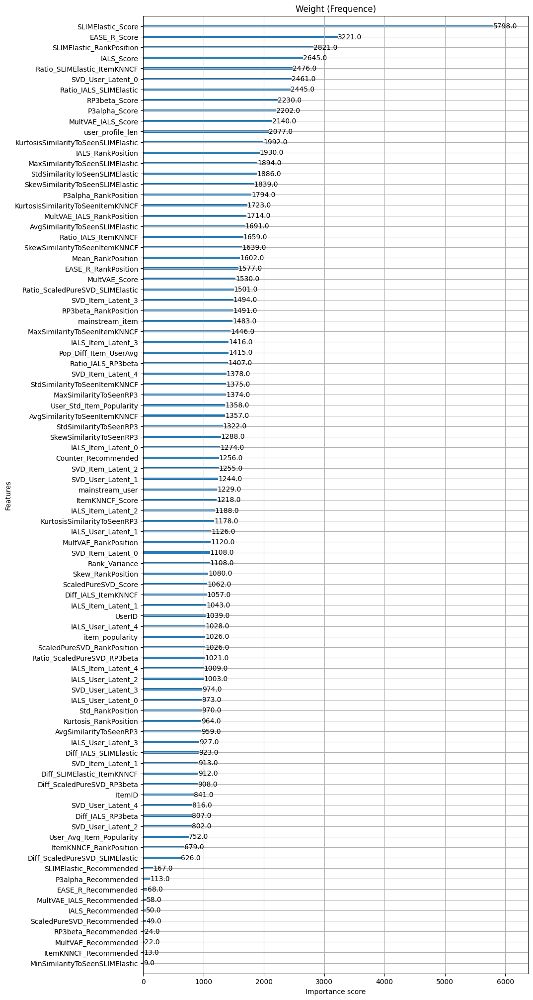

                                Feature  Importance
8                     SLIMElastic_Score      5798.0
11                         EASE_R_Score      3221.0
9              SLIMElastic_RankPosition      2821.0
5                            IALS_Score      2645.0
88          Ratio_SLIMElastic_ItemKNNCF      2476.0
68                    SVD_User_Latent_0      2461.0
78               Ratio_IALS_SLIMElastic      2445.0
14                        RP3beta_Score      2230.0
17                        P3alpha_Score      2202.0
26                   MultVAE_IALS_Score      2140.0
51                     user_profile_len      2077.0
34  KurtosisSimilarityToSeenSLIMElastic      1992.0
6                     IALS_RankPosition      1930.0
30       MaxSimilarityToSeenSLIMElastic      1894.0
32       StdSimilarityToSeenSLIMElastic      1886.0
33      SkewSimilarityToSeenSLIMElastic      1839.0
18                 P3alpha_RankPosition      1794.0
44    KurtosisSimilarityToSeenItemKNNCF      1723.0
27          

[I 2025-12-30 20:50:53,701] Trial 3 finished with value: 0.29018113171841076 and parameters: {'n_estimators': 3988, 'learning_rate': 0.003456296579144928, 'reg_alpha': 0.00012314713929115366, 'reg_lambda': 0.0006407025037895047, 'max_depth': 5, 'max_leaves': 117, 'grow_policy': 'lossguide', 'gamma': 2.14677409125743, 'min_child_weight': 6.2241500379064815e-06, 'subsample': 0.7991037692261619, 'colsample_bytree': 0.4694511959356856}. Best is trial 3 with value: 0.29018113171841076.


[20:51:02] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


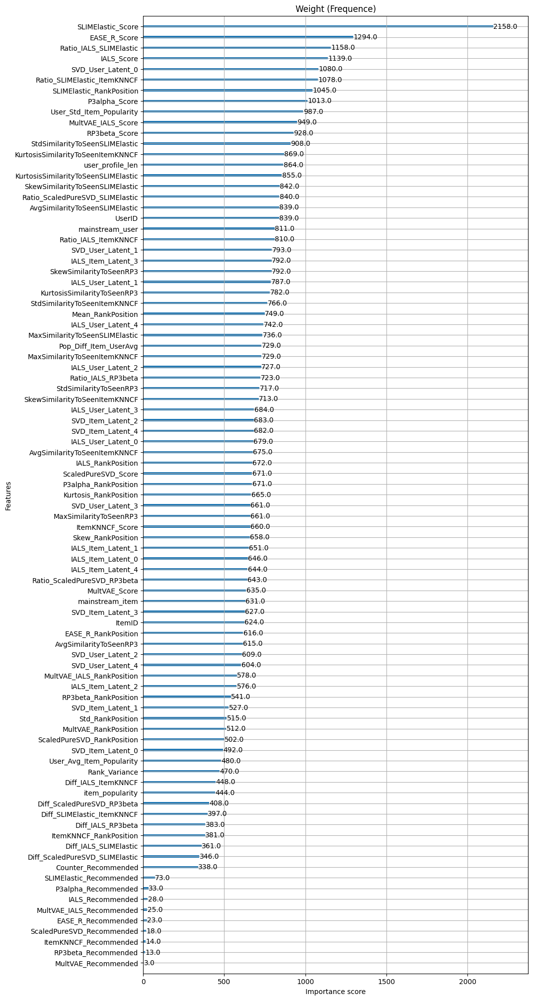

                                Feature  Importance
8                     SLIMElastic_Score      2158.0
11                         EASE_R_Score      1294.0
77               Ratio_IALS_SLIMElastic      1158.0
5                            IALS_Score      1139.0
67                    SVD_User_Latent_0      1080.0
87          Ratio_SLIMElastic_ItemKNNCF      1078.0
9              SLIMElastic_RankPosition      1045.0
17                        P3alpha_Score      1013.0
65             User_Std_Item_Popularity       987.0
26                   MultVAE_IALS_Score       949.0
14                        RP3beta_Score       928.0
31       StdSimilarityToSeenSLIMElastic       908.0
43    KurtosisSimilarityToSeenItemKNNCF       869.0
50                     user_profile_len       864.0
33  KurtosisSimilarityToSeenSLIMElastic       855.0
32      SkewSimilarityToSeenSLIMElastic       842.0
81      Ratio_ScaledPureSVD_SLIMElastic       840.0
29       AvgSimilarityToSeenSLIMElastic       839.0
0           

[I 2025-12-30 21:07:27,444] Trial 4 finished with value: 0.29043929688455655 and parameters: {'n_estimators': 2486, 'learning_rate': 0.008651646667859668, 'reg_alpha': 0.9313235744858254, 'reg_lambda': 0.0020124772867487553, 'max_depth': 5, 'max_leaves': 833, 'grow_policy': 'depthwise', 'gamma': 3.2639971479043806, 'min_child_weight': 0.098532250590167, 'subsample': 0.2868351382741682, 'colsample_bytree': 0.4726499862922887}. Best is trial 4 with value: 0.29043929688455655.


[21:07:36] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


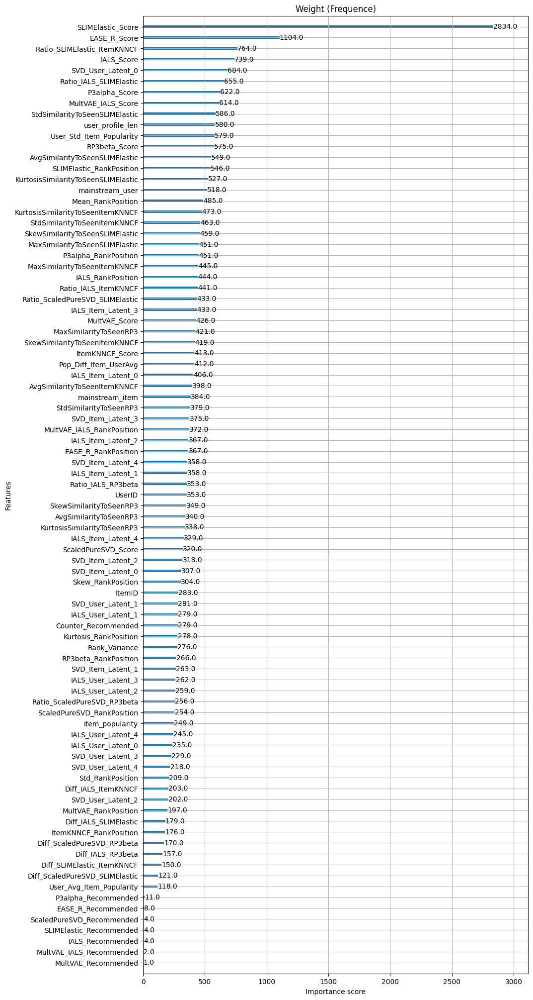

                                Feature  Importance
8                     SLIMElastic_Score      2834.0
11                         EASE_R_Score      1104.0
85          Ratio_SLIMElastic_ItemKNNCF       764.0
5                            IALS_Score       739.0
65                    SVD_User_Latent_0       684.0
75               Ratio_IALS_SLIMElastic       655.0
16                        P3alpha_Score       622.0
24                   MultVAE_IALS_Score       614.0
29       StdSimilarityToSeenSLIMElastic       586.0
48                     user_profile_len       580.0
63             User_Std_Item_Popularity       579.0
14                        RP3beta_Score       575.0
27       AvgSimilarityToSeenSLIMElastic       549.0
9              SLIMElastic_RankPosition       546.0
31  KurtosisSimilarityToSeenSLIMElastic       527.0
49                      mainstream_user       518.0
43                    Mean_RankPosition       485.0
41    KurtosisSimilarityToSeenItemKNNCF       473.0
39         S

[I 2025-12-30 21:33:30,874] Trial 5 finished with value: 0.29002537168747067 and parameters: {'n_estimators': 4713, 'learning_rate': 0.006264803618120646, 'reg_alpha': 1.1439963440634902e-05, 'reg_lambda': 0.4545518370754977, 'max_depth': 3, 'max_leaves': 736, 'grow_policy': 'lossguide', 'gamma': 0.5694600897626544, 'min_child_weight': 5.2417613534462794e-05, 'subsample': 0.3307192922242325, 'colsample_bytree': 0.741044159165395}. Best is trial 4 with value: 0.29043929688455655.


[21:33:40] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


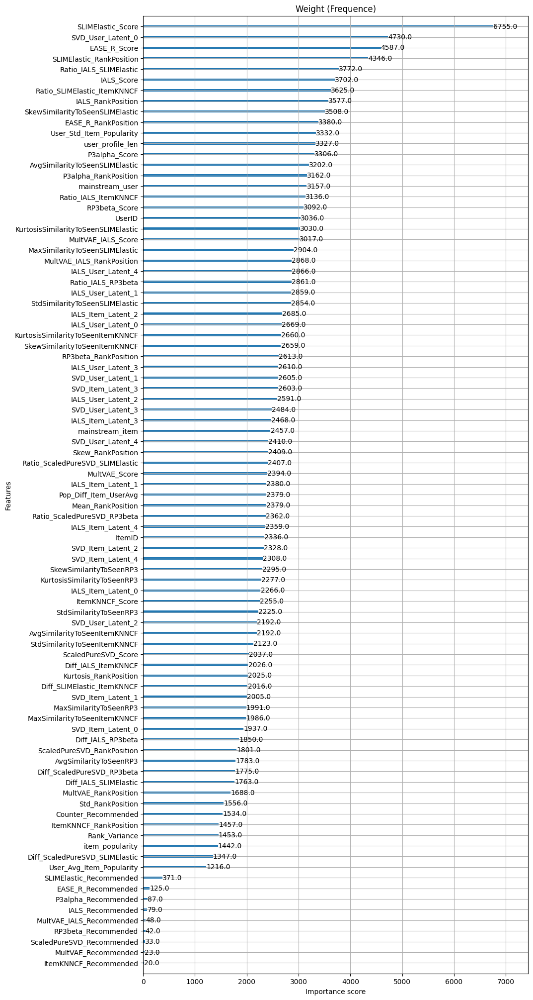

                                Feature  Importance
8                     SLIMElastic_Score      6755.0
67                    SVD_User_Latent_0      4730.0
11                         EASE_R_Score      4587.0
9              SLIMElastic_RankPosition      4346.0
77               Ratio_IALS_SLIMElastic      3772.0
5                            IALS_Score      3702.0
87          Ratio_SLIMElastic_ItemKNNCF      3625.0
6                     IALS_RankPosition      3577.0
32      SkewSimilarityToSeenSLIMElastic      3508.0
12                  EASE_R_RankPosition      3380.0
65             User_Std_Item_Popularity      3332.0
50                     user_profile_len      3327.0
17                        P3alpha_Score      3306.0
29       AvgSimilarityToSeenSLIMElastic      3202.0
18                 P3alpha_RankPosition      3162.0
51                      mainstream_user      3157.0
85                 Ratio_IALS_ItemKNNCF      3136.0
14                        RP3beta_Score      3092.0
0           

[I 2025-12-30 21:46:24,778] Trial 6 finished with value: 0.28997488729145965 and parameters: {'n_estimators': 1162, 'learning_rate': 0.0011799924379366784, 'reg_alpha': 0.011225110409849106, 'reg_lambda': 0.001873206352182442, 'max_depth': 8, 'max_leaves': 449, 'grow_policy': 'lossguide', 'gamma': 2.967276756199284, 'min_child_weight': 1.0450147248330377, 'subsample': 0.4420505279947963, 'colsample_bytree': 0.6476442600793092}. Best is trial 4 with value: 0.29043929688455655.


[21:46:34] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


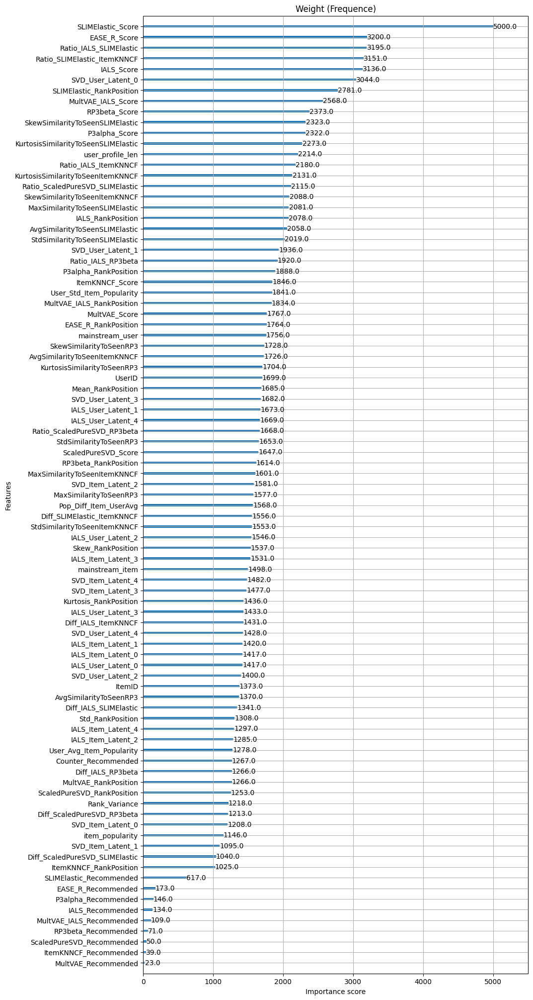

                                Feature  Importance
8                     SLIMElastic_Score      5000.0
11                         EASE_R_Score      3200.0
77               Ratio_IALS_SLIMElastic      3195.0
87          Ratio_SLIMElastic_ItemKNNCF      3151.0
5                            IALS_Score      3136.0
67                    SVD_User_Latent_0      3044.0
9              SLIMElastic_RankPosition      2781.0
26                   MultVAE_IALS_Score      2568.0
14                        RP3beta_Score      2373.0
32      SkewSimilarityToSeenSLIMElastic      2323.0
17                        P3alpha_Score      2322.0
33  KurtosisSimilarityToSeenSLIMElastic      2273.0
50                     user_profile_len      2214.0
85                 Ratio_IALS_ItemKNNCF      2180.0
43    KurtosisSimilarityToSeenItemKNNCF      2131.0
81      Ratio_ScaledPureSVD_SLIMElastic      2115.0
42        SkewSimilarityToSeenItemKNNCF      2088.0
30       MaxSimilarityToSeenSLIMElastic      2081.0
6           

[I 2025-12-30 22:10:00,844] Trial 7 finished with value: 0.2900324278590182 and parameters: {'n_estimators': 2971, 'learning_rate': 0.0029984280618370615, 'reg_alpha': 0.0139077730802934, 'reg_lambda': 0.018939571367022758, 'max_depth': 8, 'max_leaves': 351, 'grow_policy': 'depthwise', 'gamma': 5.280091332874273, 'min_child_weight': 0.2884813035654245, 'subsample': 0.591346905484353, 'colsample_bytree': 0.3488576063765204}. Best is trial 4 with value: 0.29043929688455655.


[22:10:10] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


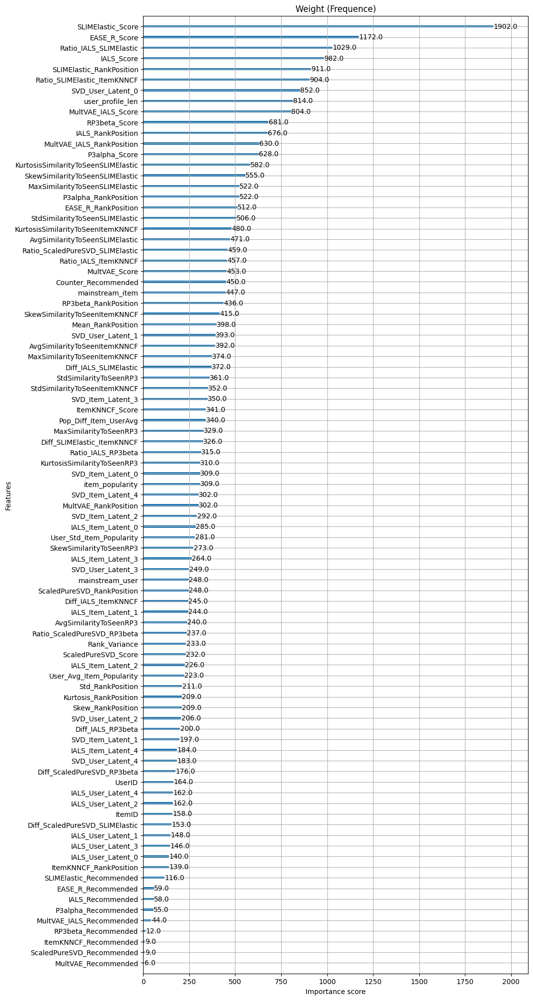

                                Feature  Importance
8                     SLIMElastic_Score      1902.0
11                         EASE_R_Score      1172.0
77               Ratio_IALS_SLIMElastic      1029.0
5                            IALS_Score       982.0
9              SLIMElastic_RankPosition       911.0
87          Ratio_SLIMElastic_ItemKNNCF       904.0
67                    SVD_User_Latent_0       852.0
50                     user_profile_len       814.0
26                   MultVAE_IALS_Score       804.0
14                        RP3beta_Score       681.0
6                     IALS_RankPosition       676.0
27            MultVAE_IALS_RankPosition       630.0
17                        P3alpha_Score       628.0
33  KurtosisSimilarityToSeenSLIMElastic       582.0
32      SkewSimilarityToSeenSLIMElastic       555.0
30       MaxSimilarityToSeenSLIMElastic       522.0
18                 P3alpha_RankPosition       522.0
12                  EASE_R_RankPosition       512.0
31       Std

[I 2025-12-30 22:24:14,542] Trial 8 finished with value: 0.29000660351545066 and parameters: {'n_estimators': 2096, 'learning_rate': 0.0058902837433595, 'reg_alpha': 0.0016045828199298632, 'reg_lambda': 0.004944016413228257, 'max_depth': 5, 'max_leaves': 404, 'grow_policy': 'lossguide', 'gamma': 4.746203491232163, 'min_child_weight': 1.6817671261268405e-07, 'subsample': 0.8771046714186944, 'colsample_bytree': 0.2905188139600841}. Best is trial 4 with value: 0.29043929688455655.


[22:24:23] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


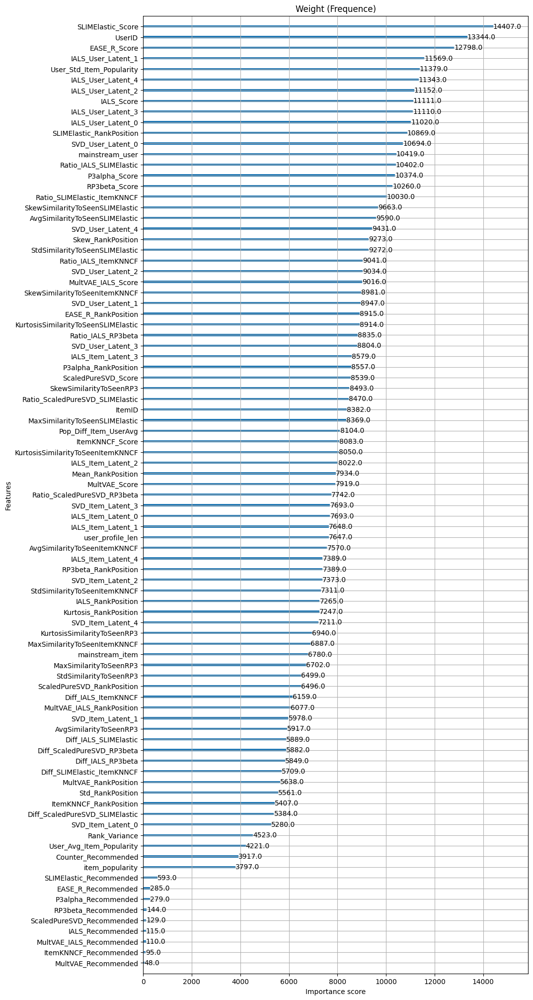

                                Feature  Importance
8                     SLIMElastic_Score     14407.0
0                                UserID     13344.0
11                         EASE_R_Score     12798.0
54                   IALS_User_Latent_1     11569.0
65             User_Std_Item_Popularity     11379.0
57                   IALS_User_Latent_4     11343.0
55                   IALS_User_Latent_2     11152.0
5                            IALS_Score     11111.0
56                   IALS_User_Latent_3     11110.0
53                   IALS_User_Latent_0     11020.0
9              SLIMElastic_RankPosition     10869.0
67                    SVD_User_Latent_0     10694.0
51                      mainstream_user     10419.0
77               Ratio_IALS_SLIMElastic     10402.0
17                        P3alpha_Score     10374.0
14                        RP3beta_Score     10260.0
87          Ratio_SLIMElastic_ItemKNNCF     10030.0
32      SkewSimilarityToSeenSLIMElastic      9663.0
29       Avg

[I 2025-12-30 22:55:46,153] Trial 9 finished with value: 0.2908214479059746 and parameters: {'n_estimators': 3517, 'learning_rate': 0.003288390314102878, 'reg_alpha': 0.0005452807575502168, 'reg_lambda': 0.001036018691102968, 'max_depth': 8, 'max_leaves': 392, 'grow_policy': 'depthwise', 'gamma': 0.791580569249991, 'min_child_weight': 0.009808244178185328, 'subsample': 0.41679906671158934, 'colsample_bytree': 0.6211228170015414}. Best is trial 9 with value: 0.2908214479059746.


[22:55:55] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


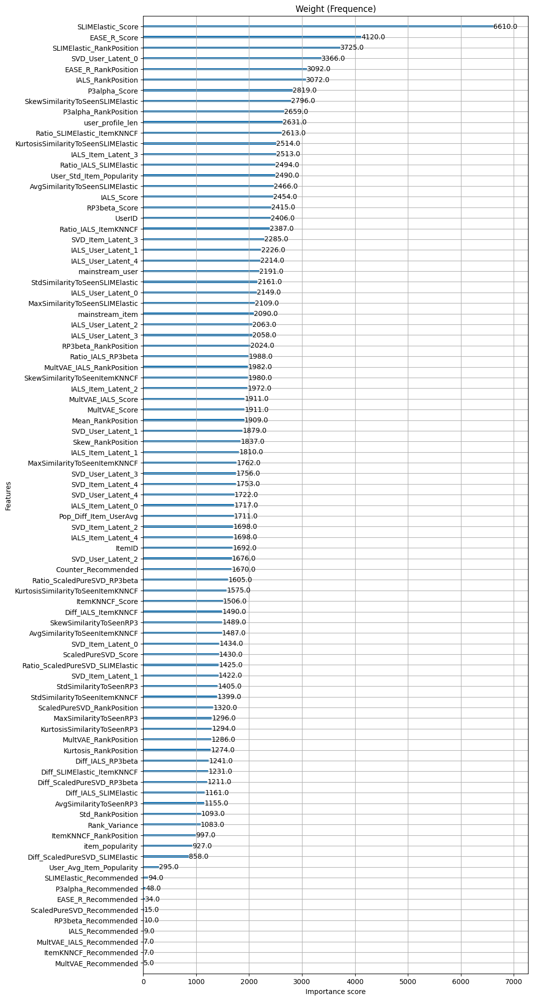

                                Feature  Importance
8                     SLIMElastic_Score      6610.0
11                         EASE_R_Score      4120.0
9              SLIMElastic_RankPosition      3725.0
67                    SVD_User_Latent_0      3366.0
12                  EASE_R_RankPosition      3092.0
6                     IALS_RankPosition      3072.0
17                        P3alpha_Score      2819.0
32      SkewSimilarityToSeenSLIMElastic      2796.0
18                 P3alpha_RankPosition      2659.0
50                     user_profile_len      2631.0
87          Ratio_SLIMElastic_ItemKNNCF      2613.0
33  KurtosisSimilarityToSeenSLIMElastic      2514.0
61                   IALS_Item_Latent_3      2513.0
77               Ratio_IALS_SLIMElastic      2494.0
65             User_Std_Item_Popularity      2490.0
29       AvgSimilarityToSeenSLIMElastic      2466.0
5                            IALS_Score      2454.0
14                        RP3beta_Score      2415.0
0           

[I 2025-12-30 23:08:17,612] Trial 10 finished with value: 0.2896080503510964 and parameters: {'n_estimators': 1325, 'learning_rate': 0.0019740160917262823, 'reg_alpha': 2.9883389450455783e-05, 'reg_lambda': 1.7265922437564546e-05, 'max_depth': 7, 'max_leaves': 580, 'grow_policy': 'depthwise', 'gamma': 0.5114952678355746, 'min_child_weight': 0.002143451888433594, 'subsample': 0.5182180129568219, 'colsample_bytree': 0.8730532793303875}. Best is trial 9 with value: 0.2908214479059746.


[23:08:26] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


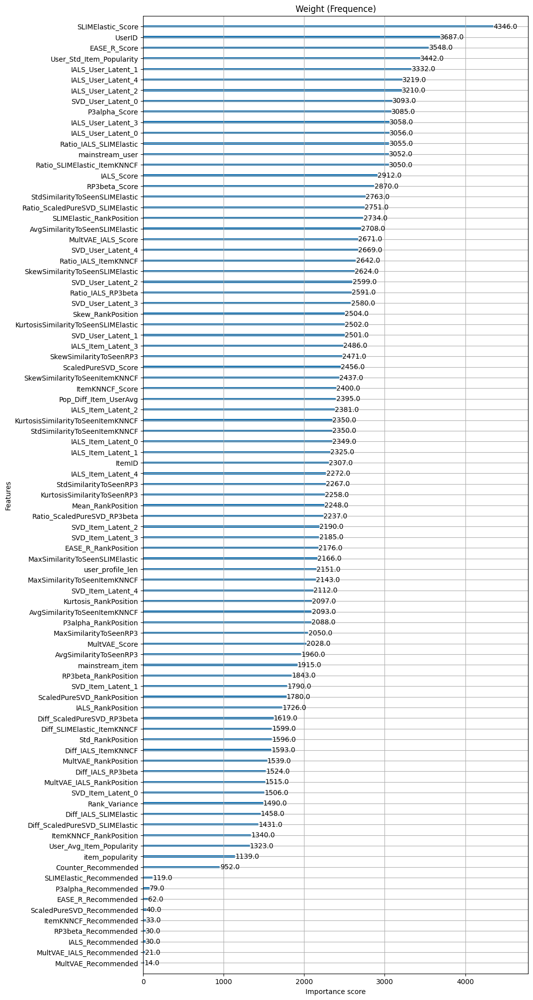

                                Feature  Importance
8                     SLIMElastic_Score      4346.0
0                                UserID      3687.0
11                         EASE_R_Score      3548.0
65             User_Std_Item_Popularity      3442.0
54                   IALS_User_Latent_1      3332.0
57                   IALS_User_Latent_4      3219.0
55                   IALS_User_Latent_2      3210.0
67                    SVD_User_Latent_0      3093.0
17                        P3alpha_Score      3085.0
56                   IALS_User_Latent_3      3058.0
53                   IALS_User_Latent_0      3056.0
77               Ratio_IALS_SLIMElastic      3055.0
51                      mainstream_user      3052.0
87          Ratio_SLIMElastic_ItemKNNCF      3050.0
5                            IALS_Score      2912.0
14                        RP3beta_Score      2870.0
31       StdSimilarityToSeenSLIMElastic      2763.0
81      Ratio_ScaledPureSVD_SLIMElastic      2751.0
9           

[I 2025-12-30 23:31:40,834] Trial 11 finished with value: 0.2904695825352682 and parameters: {'n_estimators': 3400, 'learning_rate': 0.009795523878255111, 'reg_alpha': 0.6099467689461947, 'reg_lambda': 0.00022311214529649936, 'max_depth': 6, 'max_leaves': 533, 'grow_policy': 'depthwise', 'gamma': 1.0083697887102048, 'min_child_weight': 0.02641724728853698, 'subsample': 0.24995288494119033, 'colsample_bytree': 0.605807645447182}. Best is trial 9 with value: 0.2908214479059746.


[23:31:50] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


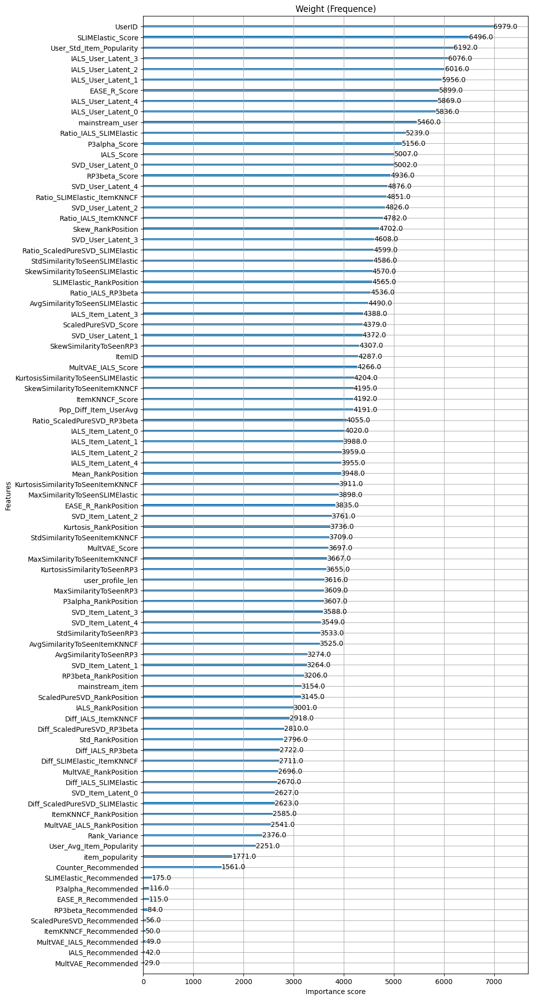

                                Feature  Importance
0                                UserID      6979.0
8                     SLIMElastic_Score      6496.0
65             User_Std_Item_Popularity      6192.0
56                   IALS_User_Latent_3      6076.0
55                   IALS_User_Latent_2      6016.0
54                   IALS_User_Latent_1      5956.0
11                         EASE_R_Score      5899.0
57                   IALS_User_Latent_4      5869.0
53                   IALS_User_Latent_0      5836.0
51                      mainstream_user      5460.0
77               Ratio_IALS_SLIMElastic      5239.0
17                        P3alpha_Score      5156.0
5                            IALS_Score      5007.0
67                    SVD_User_Latent_0      5002.0
14                        RP3beta_Score      4936.0
71                    SVD_User_Latent_4      4876.0
87          Ratio_SLIMElastic_ItemKNNCF      4851.0
69                    SVD_User_Latent_2      4826.0
85          

[I 2025-12-30 23:57:12,101] Trial 12 finished with value: 0.28828922220017367 and parameters: {'n_estimators': 3468, 'learning_rate': 0.009091878992135245, 'reg_alpha': 0.06543007937506719, 'reg_lambda': 8.491911682865095e-05, 'max_depth': 7, 'max_leaves': 531, 'grow_policy': 'depthwise', 'gamma': 1.0192826349517554, 'min_child_weight': 0.029028281685729053, 'subsample': 0.23303346818812135, 'colsample_bytree': 0.6236930234853008}. Best is trial 9 with value: 0.2908214479059746.


[23:57:21] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


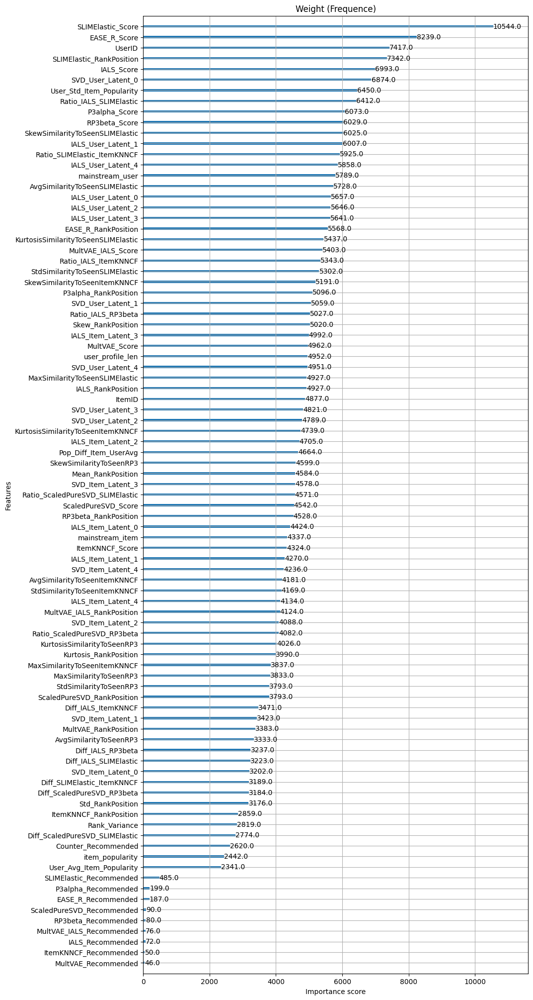

                                Feature  Importance
8                     SLIMElastic_Score     10544.0
11                         EASE_R_Score      8239.0
0                                UserID      7417.0
9              SLIMElastic_RankPosition      7342.0
5                            IALS_Score      6993.0
67                    SVD_User_Latent_0      6874.0
65             User_Std_Item_Popularity      6450.0
77               Ratio_IALS_SLIMElastic      6412.0
17                        P3alpha_Score      6073.0
14                        RP3beta_Score      6029.0
32      SkewSimilarityToSeenSLIMElastic      6025.0
54                   IALS_User_Latent_1      6007.0
87          Ratio_SLIMElastic_ItemKNNCF      5925.0
57                   IALS_User_Latent_4      5858.0
51                      mainstream_user      5789.0
29       AvgSimilarityToSeenSLIMElastic      5728.0
53                   IALS_User_Latent_0      5657.0
55                   IALS_User_Latent_2      5646.0
56          

[I 2025-12-31 00:25:04,264] Trial 13 finished with value: 0.2901887014245741 and parameters: {'n_estimators': 3377, 'learning_rate': 0.002337386182607998, 'reg_alpha': 0.0013235774677660495, 'reg_lambda': 0.000155138167954375, 'max_depth': 7, 'max_leaves': 518, 'grow_policy': 'depthwise', 'gamma': 0.1856563500644007, 'min_child_weight': 0.000540051824289179, 'subsample': 0.39059564246590406, 'colsample_bytree': 0.6231734068609749}. Best is trial 9 with value: 0.2908214479059746.


[00:25:13] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


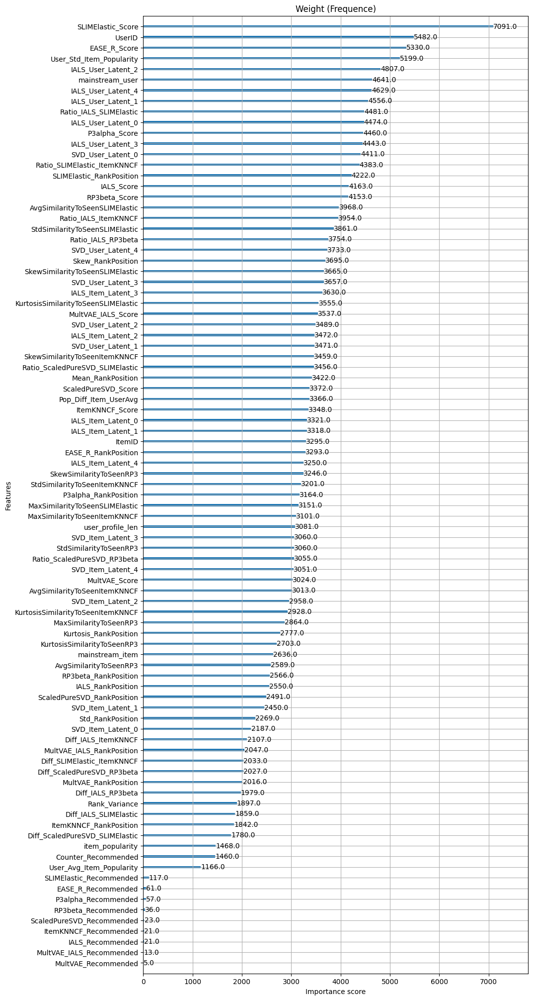

                                Feature  Importance
8                     SLIMElastic_Score      7091.0
0                                UserID      5482.0
11                         EASE_R_Score      5330.0
65             User_Std_Item_Popularity      5199.0
55                   IALS_User_Latent_2      4807.0
51                      mainstream_user      4641.0
57                   IALS_User_Latent_4      4629.0
54                   IALS_User_Latent_1      4556.0
77               Ratio_IALS_SLIMElastic      4481.0
53                   IALS_User_Latent_0      4474.0
17                        P3alpha_Score      4460.0
56                   IALS_User_Latent_3      4443.0
67                    SVD_User_Latent_0      4411.0
87          Ratio_SLIMElastic_ItemKNNCF      4383.0
9              SLIMElastic_RankPosition      4222.0
5                            IALS_Score      4163.0
14                        RP3beta_Score      4153.0
29       AvgSimilarityToSeenSLIMElastic      3968.0
85          

[I 2025-12-31 00:58:27,301] Trial 14 finished with value: 0.2902979690532524 and parameters: {'n_estimators': 4946, 'learning_rate': 0.004845413709556855, 'reg_alpha': 0.0002438810661286833, 'reg_lambda': 0.00018992166762583083, 'max_depth': 6, 'max_leaves': 196, 'grow_policy': 'depthwise', 'gamma': 1.1148032802424679, 'min_child_weight': 0.007537280295421172, 'subsample': 0.20932170278791792, 'colsample_bytree': 0.7501698533672025}. Best is trial 9 with value: 0.2908214479059746.


[00:58:36] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


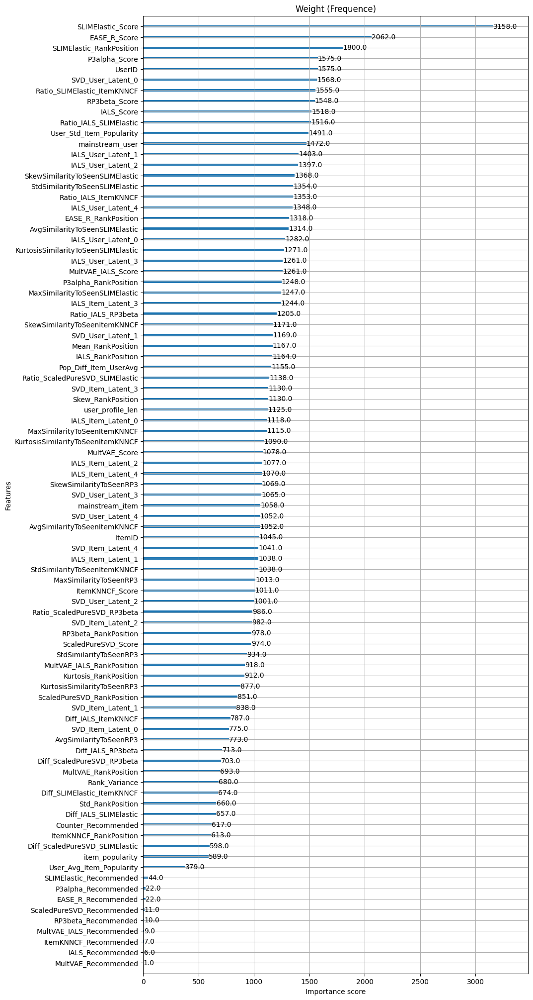

                                Feature  Importance
8                     SLIMElastic_Score      3158.0
11                         EASE_R_Score      2062.0
9              SLIMElastic_RankPosition      1800.0
0                                UserID      1575.0
17                        P3alpha_Score      1575.0
67                    SVD_User_Latent_0      1568.0
87          Ratio_SLIMElastic_ItemKNNCF      1555.0
14                        RP3beta_Score      1548.0
5                            IALS_Score      1518.0
77               Ratio_IALS_SLIMElastic      1516.0
65             User_Std_Item_Popularity      1491.0
51                      mainstream_user      1472.0
54                   IALS_User_Latent_1      1403.0
55                   IALS_User_Latent_2      1397.0
32      SkewSimilarityToSeenSLIMElastic      1368.0
31       StdSimilarityToSeenSLIMElastic      1354.0
85                 Ratio_IALS_ItemKNNCF      1353.0
57                   IALS_User_Latent_4      1348.0
12          

[I 2025-12-31 01:10:28,262] Trial 15 finished with value: 0.2904940092506918 and parameters: {'n_estimators': 1539, 'learning_rate': 0.009774473250771677, 'reg_alpha': 0.1406819830088569, 'reg_lambda': 1.8463026826912713e-05, 'max_depth': 6, 'max_leaves': 635, 'grow_policy': 'depthwise', 'gamma': 0.37975500745698537, 'min_child_weight': 5.6281289883926046e-05, 'subsample': 0.4728107963032339, 'colsample_bytree': 0.751904166160964}. Best is trial 9 with value: 0.2908214479059746.


[01:10:37] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


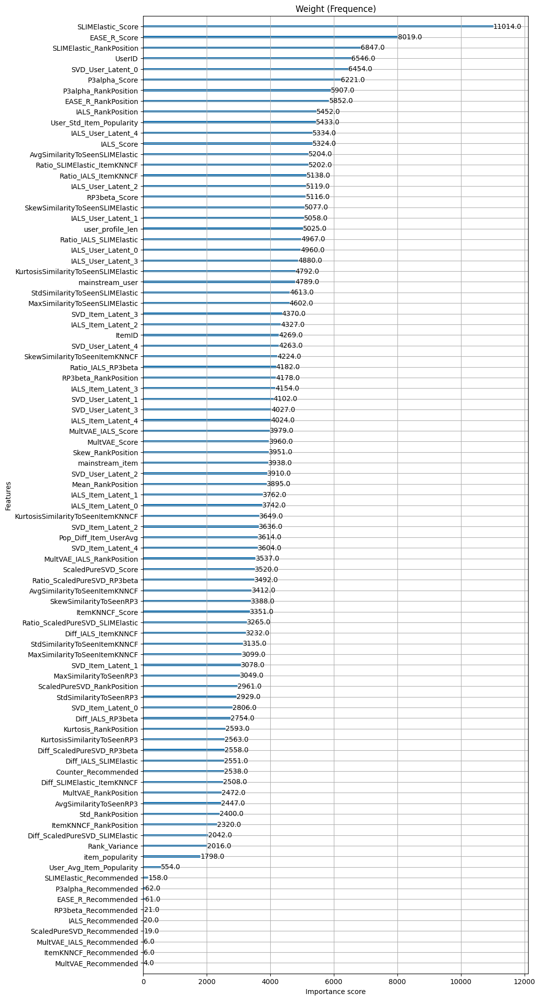

                                Feature  Importance
8                     SLIMElastic_Score     11014.0
11                         EASE_R_Score      8019.0
9              SLIMElastic_RankPosition      6847.0
0                                UserID      6546.0
67                    SVD_User_Latent_0      6454.0
17                        P3alpha_Score      6221.0
18                 P3alpha_RankPosition      5907.0
12                  EASE_R_RankPosition      5852.0
6                     IALS_RankPosition      5452.0
65             User_Std_Item_Popularity      5433.0
57                   IALS_User_Latent_4      5334.0
5                            IALS_Score      5324.0
29       AvgSimilarityToSeenSLIMElastic      5204.0
87          Ratio_SLIMElastic_ItemKNNCF      5202.0
85                 Ratio_IALS_ItemKNNCF      5138.0
55                   IALS_User_Latent_2      5119.0
14                        RP3beta_Score      5116.0
32      SkewSimilarityToSeenSLIMElastic      5077.0
54          

[I 2025-12-31 01:26:17,710] Trial 16 finished with value: 0.28972620597584736 and parameters: {'n_estimators': 1454, 'learning_rate': 0.001536755454957454, 'reg_alpha': 0.00598509849883731, 'reg_lambda': 1.0387740613438599e-05, 'max_depth': 8, 'max_leaves': 678, 'grow_policy': 'depthwise', 'gamma': 0.29894733217829855, 'min_child_weight': 3.921661424561667e-05, 'subsample': 0.5853369264599264, 'colsample_bytree': 0.8986980351797492}. Best is trial 9 with value: 0.2908214479059746.


[01:26:27] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


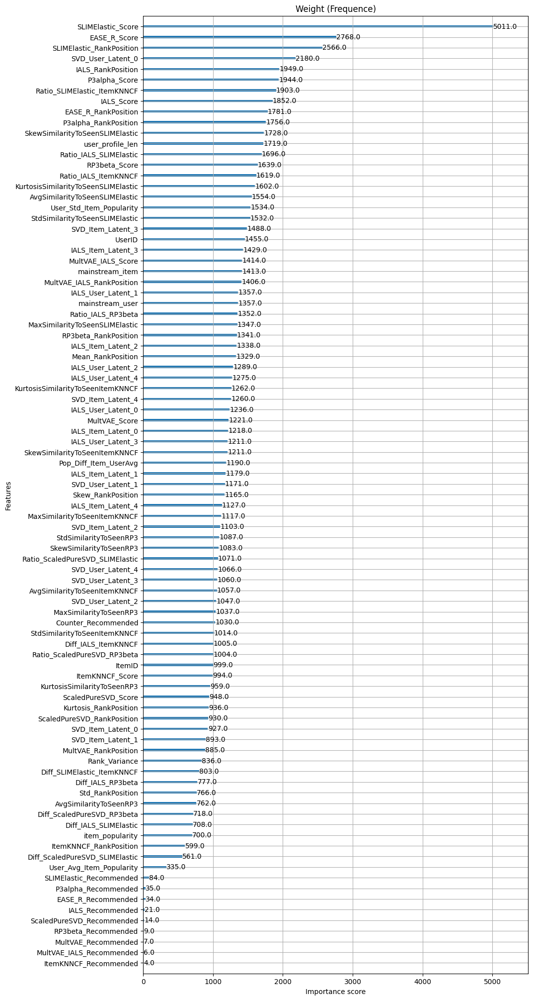

                                Feature  Importance
8                     SLIMElastic_Score      5011.0
11                         EASE_R_Score      2768.0
9              SLIMElastic_RankPosition      2566.0
67                    SVD_User_Latent_0      2180.0
6                     IALS_RankPosition      1949.0
17                        P3alpha_Score      1944.0
87          Ratio_SLIMElastic_ItemKNNCF      1903.0
5                            IALS_Score      1852.0
12                  EASE_R_RankPosition      1781.0
18                 P3alpha_RankPosition      1756.0
32      SkewSimilarityToSeenSLIMElastic      1728.0
50                     user_profile_len      1719.0
77               Ratio_IALS_SLIMElastic      1696.0
14                        RP3beta_Score      1639.0
85                 Ratio_IALS_ItemKNNCF      1619.0
33  KurtosisSimilarityToSeenSLIMElastic      1602.0
29       AvgSimilarityToSeenSLIMElastic      1554.0
65             User_Std_Item_Popularity      1534.0
31       Std

[I 2025-12-31 01:40:38,108] Trial 17 finished with value: 0.2901937773715725 and parameters: {'n_estimators': 1745, 'learning_rate': 0.0033120880404135986, 'reg_alpha': 0.1074749714324314, 'reg_lambda': 3.6490489279168015e-05, 'max_depth': 6, 'max_leaves': 62, 'grow_policy': 'depthwise', 'gamma': 0.3487497168493614, 'min_child_weight': 3.9486890287788176e-06, 'subsample': 0.4855790742889472, 'colsample_bytree': 0.7718132656286174}. Best is trial 9 with value: 0.2908214479059746.


[01:40:47] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


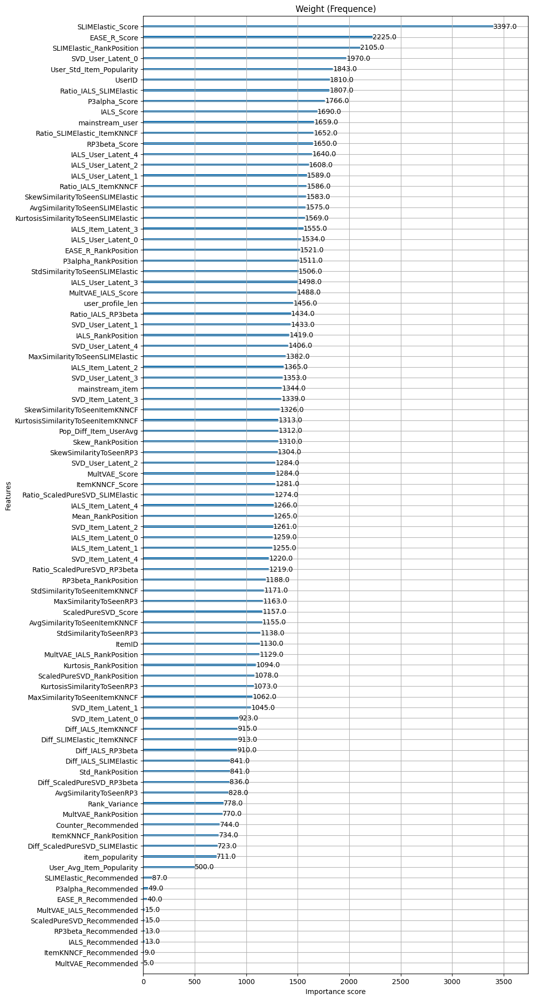

                                Feature  Importance
8                     SLIMElastic_Score      3397.0
11                         EASE_R_Score      2225.0
9              SLIMElastic_RankPosition      2105.0
67                    SVD_User_Latent_0      1970.0
65             User_Std_Item_Popularity      1843.0
0                                UserID      1810.0
77               Ratio_IALS_SLIMElastic      1807.0
17                        P3alpha_Score      1766.0
5                            IALS_Score      1690.0
51                      mainstream_user      1659.0
87          Ratio_SLIMElastic_ItemKNNCF      1652.0
14                        RP3beta_Score      1650.0
57                   IALS_User_Latent_4      1640.0
55                   IALS_User_Latent_2      1608.0
54                   IALS_User_Latent_1      1589.0
85                 Ratio_IALS_ItemKNNCF      1586.0
32      SkewSimilarityToSeenSLIMElastic      1583.0
29       AvgSimilarityToSeenSLIMElastic      1575.0
33  Kurtosis

[I 2025-12-31 01:50:15,933] Trial 18 finished with value: 0.29012350553400734 and parameters: {'n_estimators': 1030, 'learning_rate': 0.007016403945753313, 'reg_alpha': 0.18322739366771534, 'reg_lambda': 0.021797542080754018, 'max_depth': 7, 'max_leaves': 778, 'grow_policy': 'depthwise', 'gamma': 1.4633749151833375, 'min_child_weight': 0.0002108074226706093, 'subsample': 0.38337132637948734, 'colsample_bytree': 0.7105438310152679}. Best is trial 9 with value: 0.2908214479059746.


[01:50:25] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


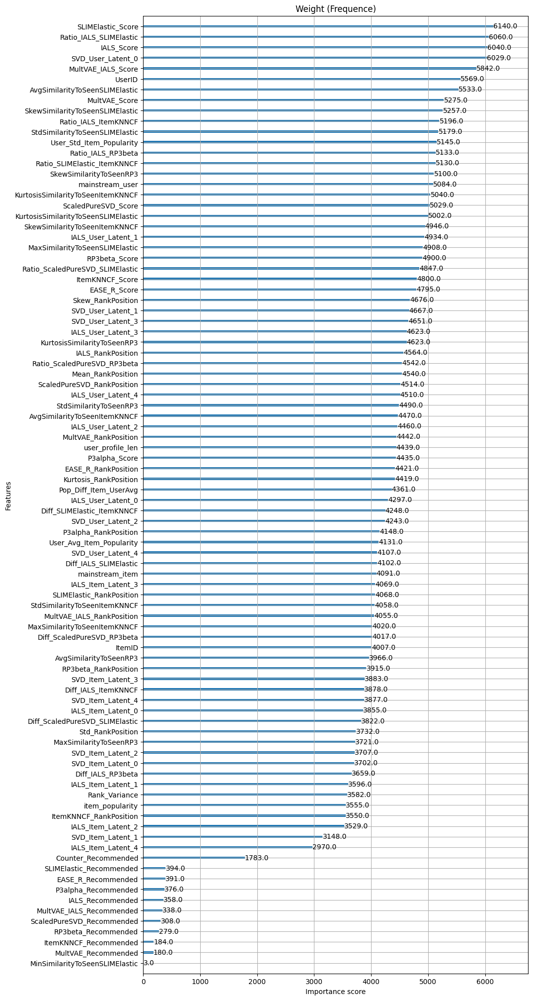

                                Feature  Importance
8                     SLIMElastic_Score      6140.0
78               Ratio_IALS_SLIMElastic      6060.0
5                            IALS_Score      6040.0
68                    SVD_User_Latent_0      6029.0
26                   MultVAE_IALS_Score      5842.0
0                                UserID      5569.0
29       AvgSimilarityToSeenSLIMElastic      5533.0
2                         MultVAE_Score      5275.0
33      SkewSimilarityToSeenSLIMElastic      5257.0
86                 Ratio_IALS_ItemKNNCF      5196.0
32       StdSimilarityToSeenSLIMElastic      5179.0
66             User_Std_Item_Popularity      5145.0
80                   Ratio_IALS_RP3beta      5133.0
88          Ratio_SLIMElastic_ItemKNNCF      5130.0
38              SkewSimilarityToSeenRP3      5100.0
52                      mainstream_user      5084.0
44    KurtosisSimilarityToSeenItemKNNCF      5040.0
20                  ScaledPureSVD_Score      5029.0
34  Kurtosis

[I 2025-12-31 02:06:30,518] Trial 19 finished with value: 0.29029148799529336 and parameters: {'n_estimators': 1626, 'learning_rate': 0.00445058377785753, 'reg_alpha': 7.535420488158652e-05, 'reg_lambda': 0.0005984967062464222, 'max_depth': 8, 'max_leaves': 439, 'grow_policy': 'depthwise', 'gamma': 0.1969955015883213, 'min_child_weight': 0.0009096060581322591, 'subsample': 0.6543356616781636, 'colsample_bytree': 0.21218052675985932}. Best is trial 9 with value: 0.2908214479059746.


[02:06:39] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


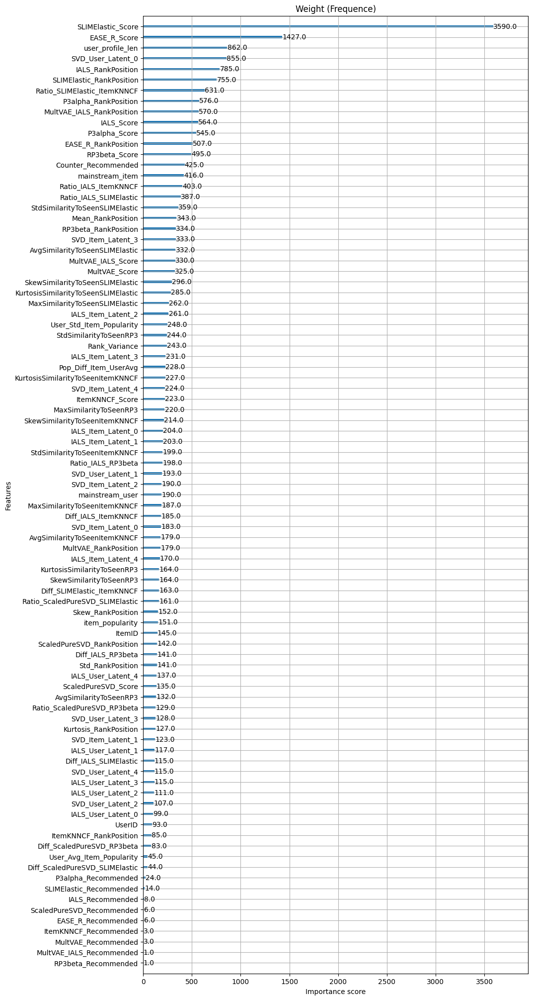

                                Feature  Importance
8                     SLIMElastic_Score      3590.0
11                         EASE_R_Score      1427.0
50                     user_profile_len       862.0
67                    SVD_User_Latent_0       855.0
6                     IALS_RankPosition       785.0
9              SLIMElastic_RankPosition       755.0
87          Ratio_SLIMElastic_ItemKNNCF       631.0
18                 P3alpha_RankPosition       576.0
27            MultVAE_IALS_RankPosition       570.0
5                            IALS_Score       564.0
17                        P3alpha_Score       545.0
12                  EASE_R_RankPosition       507.0
14                        RP3beta_Score       495.0
44                  Counter_Recommended       425.0
52                      mainstream_item       416.0
85                 Ratio_IALS_ItemKNNCF       403.0
77               Ratio_IALS_SLIMElastic       387.0
31       StdSimilarityToSeenSLIMElastic       359.0
45          

[I 2025-12-31 02:18:17,757] Trial 20 finished with value: 0.28919670682609333 and parameters: {'n_estimators': 1712, 'learning_rate': 0.0028510913571056073, 'reg_alpha': 0.0006825646767451124, 'reg_lambda': 0.006982231779510949, 'max_depth': 4, 'max_leaves': 592, 'grow_policy': 'depthwise', 'gamma': 0.6032247465811315, 'min_child_weight': 2.184688658214854e-06, 'subsample': 0.4632909733563573, 'colsample_bytree': 0.8028323077311431}. Best is trial 9 with value: 0.2908214479059746.


[02:18:27] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


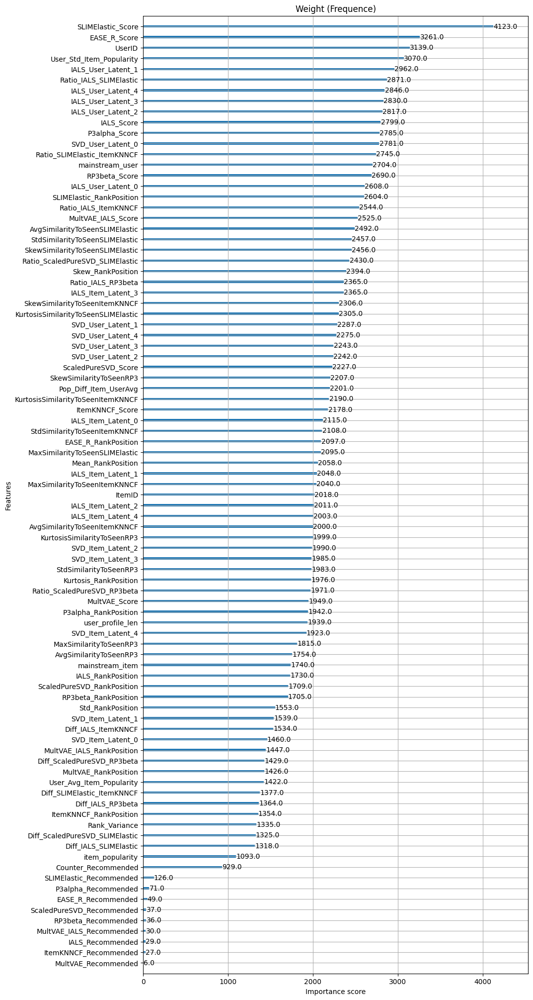

                                Feature  Importance
8                     SLIMElastic_Score      4123.0
11                         EASE_R_Score      3261.0
0                                UserID      3139.0
65             User_Std_Item_Popularity      3070.0
54                   IALS_User_Latent_1      2962.0
77               Ratio_IALS_SLIMElastic      2871.0
57                   IALS_User_Latent_4      2846.0
56                   IALS_User_Latent_3      2830.0
55                   IALS_User_Latent_2      2817.0
5                            IALS_Score      2799.0
17                        P3alpha_Score      2785.0
67                    SVD_User_Latent_0      2781.0
87          Ratio_SLIMElastic_ItemKNNCF      2745.0
51                      mainstream_user      2704.0
14                        RP3beta_Score      2690.0
53                   IALS_User_Latent_0      2608.0
9              SLIMElastic_RankPosition      2604.0
85                 Ratio_IALS_ItemKNNCF      2544.0
26          

[I 2025-12-31 02:39:56,834] Trial 21 finished with value: 0.2904012061212285 and parameters: {'n_estimators': 3080, 'learning_rate': 0.009525198509335945, 'reg_alpha': 0.33013176920090787, 'reg_lambda': 0.0004326247887740601, 'max_depth': 6, 'max_leaves': 506, 'grow_policy': 'depthwise', 'gamma': 0.9233488666909516, 'min_child_weight': 0.031657346008186774, 'subsample': 0.3134564814316533, 'colsample_bytree': 0.5596271239876778}. Best is trial 9 with value: 0.2908214479059746.


[02:40:06] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


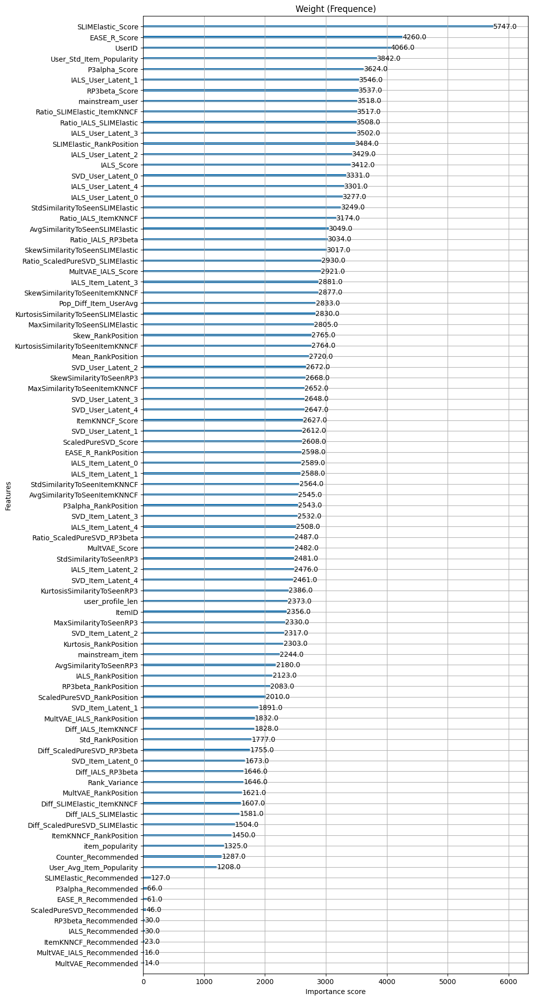

                                Feature  Importance
8                     SLIMElastic_Score      5747.0
11                         EASE_R_Score      4260.0
0                                UserID      4066.0
65             User_Std_Item_Popularity      3842.0
17                        P3alpha_Score      3624.0
54                   IALS_User_Latent_1      3546.0
14                        RP3beta_Score      3537.0
51                      mainstream_user      3518.0
87          Ratio_SLIMElastic_ItemKNNCF      3517.0
77               Ratio_IALS_SLIMElastic      3508.0
56                   IALS_User_Latent_3      3502.0
9              SLIMElastic_RankPosition      3484.0
55                   IALS_User_Latent_2      3429.0
5                            IALS_Score      3412.0
67                    SVD_User_Latent_0      3331.0
57                   IALS_User_Latent_4      3301.0
53                   IALS_User_Latent_0      3277.0
31       StdSimilarityToSeenSLIMElastic      3249.0
85          

[I 2025-12-31 03:07:31,764] Trial 22 finished with value: 0.29048096790911315 and parameters: {'n_estimators': 3938, 'learning_rate': 0.007437023382902365, 'reg_alpha': 0.026906897677417076, 'reg_lambda': 4.376779241437458e-05, 'max_depth': 6, 'max_leaves': 634, 'grow_policy': 'depthwise', 'gamma': 1.6726516251198076, 'min_child_weight': 0.00528791939677977, 'subsample': 0.4169650348015655, 'colsample_bytree': 0.6746811018044331}. Best is trial 9 with value: 0.2908214479059746.


[03:07:41] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


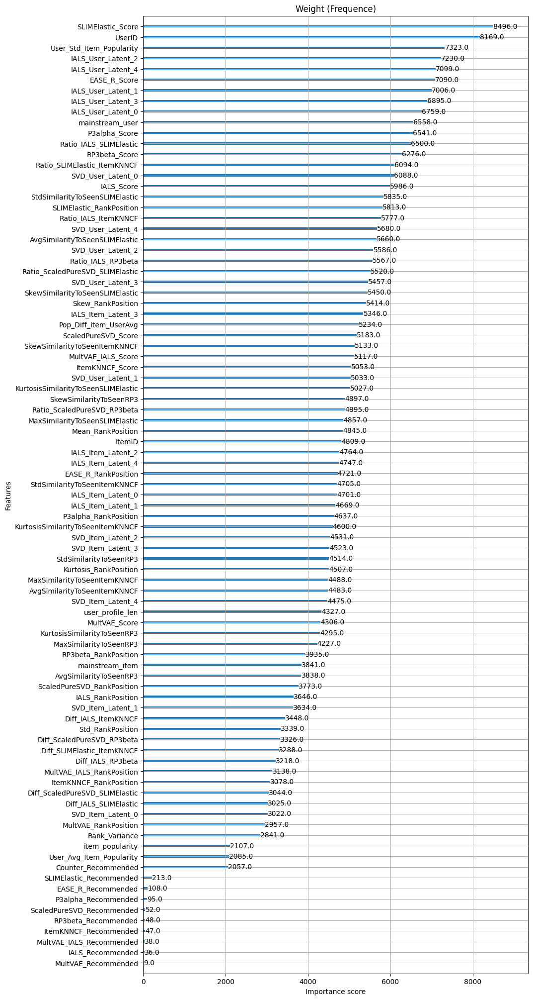

                                Feature  Importance
8                     SLIMElastic_Score      8496.0
0                                UserID      8169.0
65             User_Std_Item_Popularity      7323.0
55                   IALS_User_Latent_2      7230.0
57                   IALS_User_Latent_4      7099.0
11                         EASE_R_Score      7090.0
54                   IALS_User_Latent_1      7006.0
56                   IALS_User_Latent_3      6895.0
53                   IALS_User_Latent_0      6759.0
51                      mainstream_user      6558.0
17                        P3alpha_Score      6541.0
77               Ratio_IALS_SLIMElastic      6500.0
14                        RP3beta_Score      6276.0
87          Ratio_SLIMElastic_ItemKNNCF      6094.0
67                    SVD_User_Latent_0      6088.0
5                            IALS_Score      5986.0
31       StdSimilarityToSeenSLIMElastic      5835.0
9              SLIMElastic_RankPosition      5813.0
85          

[I 2025-12-31 03:39:35,091] Trial 23 finished with value: 0.2901613866669914 and parameters: {'n_estimators': 4275, 'learning_rate': 0.007235843207494263, 'reg_alpha': 0.03997925317316036, 'reg_lambda': 4.4658285942311616e-05, 'max_depth': 7, 'max_leaves': 657, 'grow_policy': 'depthwise', 'gamma': 1.7258432260216519, 'min_child_weight': 0.003429153816332833, 'subsample': 0.37035679921085646, 'colsample_bytree': 0.6852354137113826}. Best is trial 9 with value: 0.2908214479059746.


[03:39:44] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


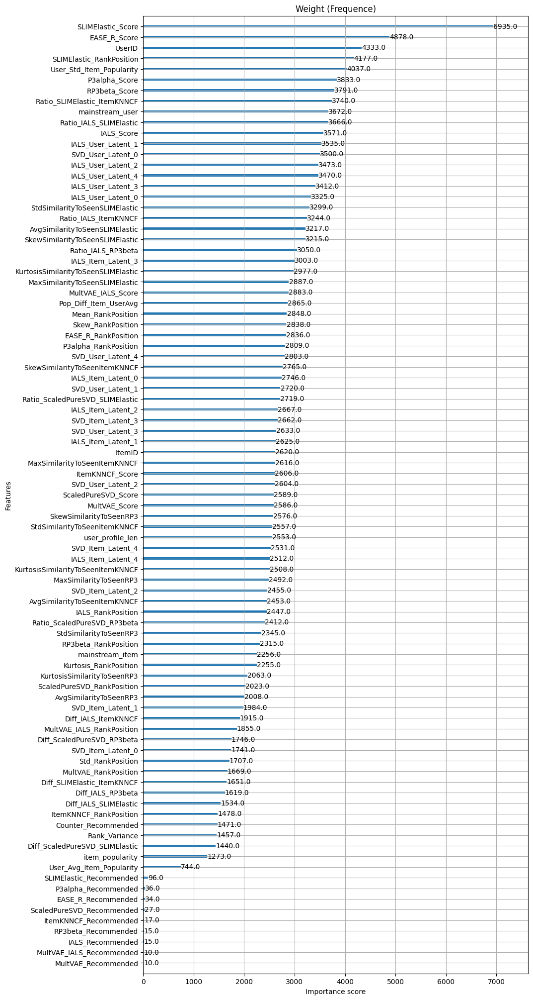

                                Feature  Importance
8                     SLIMElastic_Score      6935.0
11                         EASE_R_Score      4878.0
0                                UserID      4333.0
9              SLIMElastic_RankPosition      4177.0
65             User_Std_Item_Popularity      4037.0
17                        P3alpha_Score      3833.0
14                        RP3beta_Score      3791.0
87          Ratio_SLIMElastic_ItemKNNCF      3740.0
51                      mainstream_user      3672.0
77               Ratio_IALS_SLIMElastic      3666.0
5                            IALS_Score      3571.0
54                   IALS_User_Latent_1      3535.0
67                    SVD_User_Latent_0      3500.0
55                   IALS_User_Latent_2      3473.0
57                   IALS_User_Latent_4      3470.0
56                   IALS_User_Latent_3      3412.0
53                   IALS_User_Latent_0      3325.0
31       StdSimilarityToSeenSLIMElastic      3299.0
85          

[I 2025-12-31 04:07:10,604] Trial 24 finished with value: 0.29061739908118267 and parameters: {'n_estimators': 3811, 'learning_rate': 0.005431252617198012, 'reg_alpha': 0.0207612334244118, 'reg_lambda': 3.7022085351135135e-05, 'max_depth': 6, 'max_leaves': 741, 'grow_policy': 'depthwise', 'gamma': 0.7020182445936461, 'min_child_weight': 0.00010647302626558405, 'subsample': 0.42945814332339544, 'colsample_bytree': 0.8148018859875497}. Best is trial 9 with value: 0.2908214479059746.


[04:07:19] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


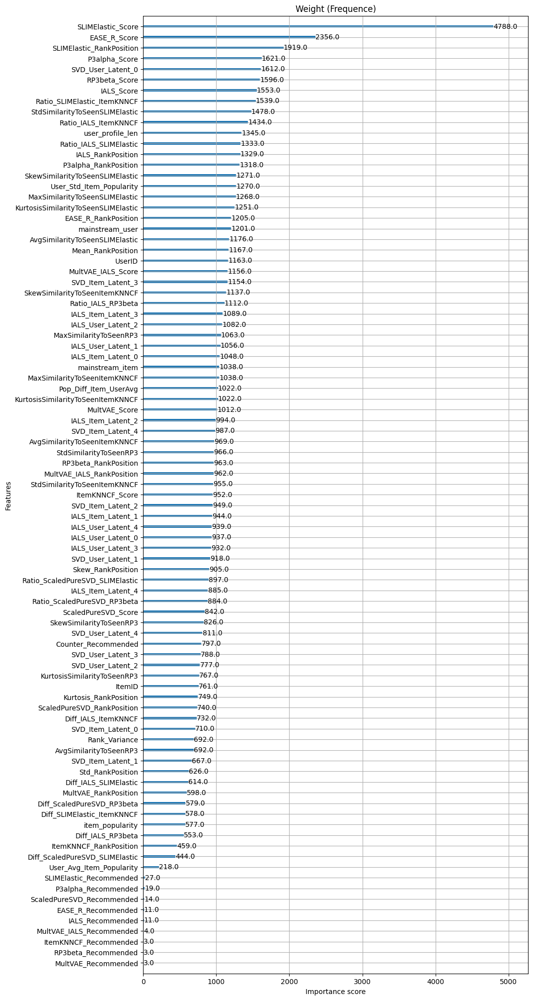

                                Feature  Importance
8                     SLIMElastic_Score      4788.0
11                         EASE_R_Score      2356.0
9              SLIMElastic_RankPosition      1919.0
17                        P3alpha_Score      1621.0
67                    SVD_User_Latent_0      1612.0
14                        RP3beta_Score      1596.0
5                            IALS_Score      1553.0
87          Ratio_SLIMElastic_ItemKNNCF      1539.0
31       StdSimilarityToSeenSLIMElastic      1478.0
85                 Ratio_IALS_ItemKNNCF      1434.0
50                     user_profile_len      1345.0
77               Ratio_IALS_SLIMElastic      1333.0
6                     IALS_RankPosition      1329.0
18                 P3alpha_RankPosition      1318.0
32      SkewSimilarityToSeenSLIMElastic      1271.0
65             User_Std_Item_Popularity      1270.0
30       MaxSimilarityToSeenSLIMElastic      1268.0
33  KurtosisSimilarityToSeenSLIMElastic      1251.0
12          

[I 2025-12-31 04:26:37,860] Trial 25 finished with value: 0.2901998766596998 and parameters: {'n_estimators': 2806, 'learning_rate': 0.005234362323729534, 'reg_alpha': 0.002930378814659503, 'reg_lambda': 2.445133958838136e-05, 'max_depth': 5, 'max_leaves': 848, 'grow_policy': 'depthwise', 'gamma': 0.3193882785020944, 'min_child_weight': 0.00010327714773525438, 'subsample': 0.5450032162033429, 'colsample_bytree': 0.8364367492274705}. Best is trial 9 with value: 0.2908214479059746.


[04:26:47] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


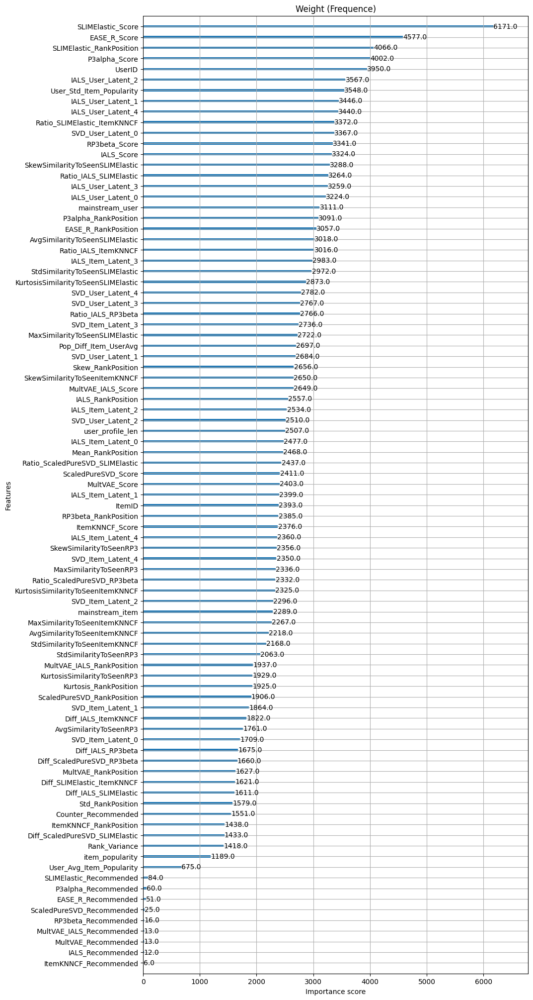

                                Feature  Importance
8                     SLIMElastic_Score      6171.0
11                         EASE_R_Score      4577.0
9              SLIMElastic_RankPosition      4066.0
17                        P3alpha_Score      4002.0
0                                UserID      3950.0
55                   IALS_User_Latent_2      3567.0
65             User_Std_Item_Popularity      3548.0
54                   IALS_User_Latent_1      3446.0
57                   IALS_User_Latent_4      3440.0
87          Ratio_SLIMElastic_ItemKNNCF      3372.0
67                    SVD_User_Latent_0      3367.0
14                        RP3beta_Score      3341.0
5                            IALS_Score      3324.0
32      SkewSimilarityToSeenSLIMElastic      3288.0
77               Ratio_IALS_SLIMElastic      3264.0
56                   IALS_User_Latent_3      3259.0
53                   IALS_User_Latent_0      3224.0
51                      mainstream_user      3111.0
18          

[I 2025-12-31 04:42:33,055] Trial 26 finished with value: 0.2904495040358671 and parameters: {'n_estimators': 1879, 'learning_rate': 0.0056433029875873, 'reg_alpha': 0.016023345243945143, 'reg_lambda': 1.044050041192088e-05, 'max_depth': 7, 'max_leaves': 738, 'grow_policy': 'lossguide', 'gamma': 0.6921294408962455, 'min_child_weight': 1.91108539560974e-05, 'subsample': 0.5046840546895167, 'colsample_bytree': 0.8204029884128224}. Best is trial 9 with value: 0.2908214479059746.


[04:42:42] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


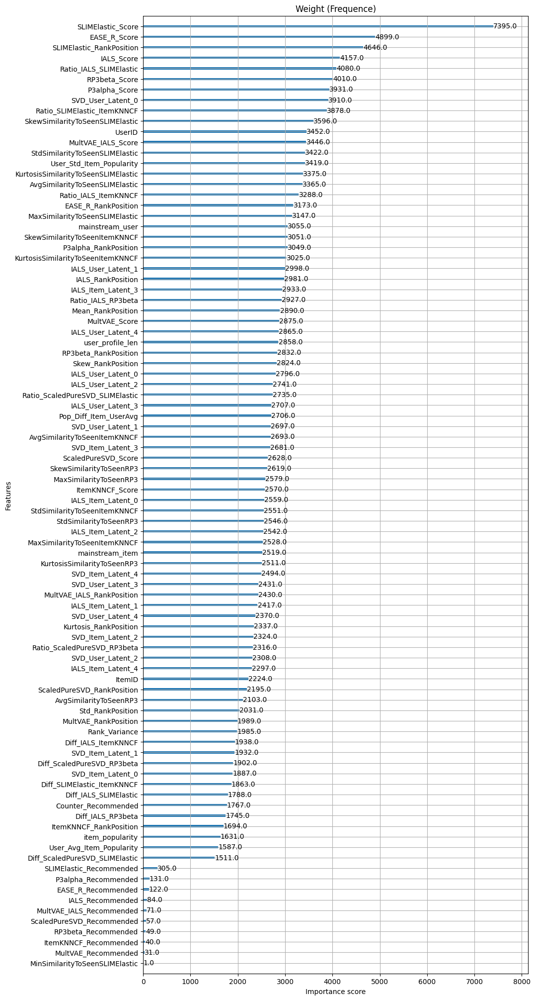

                                Feature  Importance
8                     SLIMElastic_Score      7395.0
11                         EASE_R_Score      4899.0
9              SLIMElastic_RankPosition      4646.0
5                            IALS_Score      4157.0
78               Ratio_IALS_SLIMElastic      4080.0
14                        RP3beta_Score      4010.0
17                        P3alpha_Score      3931.0
68                    SVD_User_Latent_0      3910.0
88          Ratio_SLIMElastic_ItemKNNCF      3878.0
33      SkewSimilarityToSeenSLIMElastic      3596.0
0                                UserID      3452.0
26                   MultVAE_IALS_Score      3446.0
32       StdSimilarityToSeenSLIMElastic      3422.0
66             User_Std_Item_Popularity      3419.0
34  KurtosisSimilarityToSeenSLIMElastic      3375.0
29       AvgSimilarityToSeenSLIMElastic      3365.0
86                 Ratio_IALS_ItemKNNCF      3288.0
12                  EASE_R_RankPosition      3173.0
30       Max

[I 2025-12-31 05:10:40,033] Trial 27 finished with value: 0.29058575161447475 and parameters: {'n_estimators': 3770, 'learning_rate': 0.003647878962905524, 'reg_alpha': 0.00447416477465724, 'reg_lambda': 8.328549829963857e-05, 'max_depth': 6, 'max_leaves': 738, 'grow_policy': 'depthwise', 'gamma': 0.4371917307615312, 'min_child_weight': 0.0003625331355155436, 'subsample': 0.6019454842170545, 'colsample_bytree': 0.543874957090556}. Best is trial 9 with value: 0.2908214479059746.


[05:10:49] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


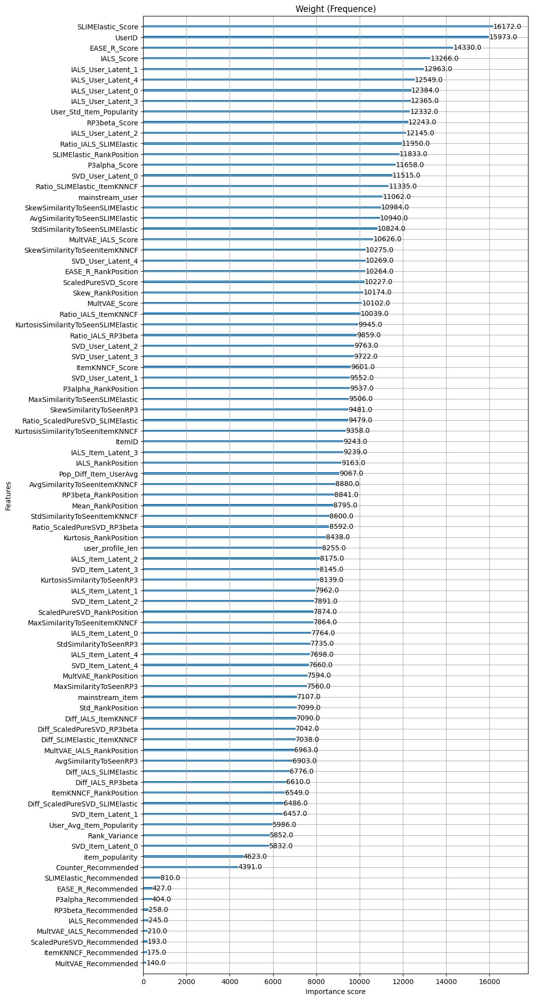

                                Feature  Importance
8                     SLIMElastic_Score     16172.0
0                                UserID     15973.0
11                         EASE_R_Score     14330.0
5                            IALS_Score     13266.0
54                   IALS_User_Latent_1     12963.0
57                   IALS_User_Latent_4     12549.0
53                   IALS_User_Latent_0     12384.0
56                   IALS_User_Latent_3     12365.0
65             User_Std_Item_Popularity     12332.0
14                        RP3beta_Score     12243.0
55                   IALS_User_Latent_2     12145.0
77               Ratio_IALS_SLIMElastic     11950.0
9              SLIMElastic_RankPosition     11833.0
17                        P3alpha_Score     11658.0
67                    SVD_User_Latent_0     11515.0
87          Ratio_SLIMElastic_ItemKNNCF     11335.0
51                      mainstream_user     11062.0
32      SkewSimilarityToSeenSLIMElastic     10984.0
29       Avg

[I 2025-12-31 05:44:08,718] Trial 28 finished with value: 0.2908452650455368 and parameters: {'n_estimators': 3799, 'learning_rate': 0.003788962767316072, 'reg_alpha': 0.005584943621432343, 'reg_lambda': 8.052708055757246e-05, 'max_depth': 8, 'max_leaves': 302, 'grow_policy': 'depthwise', 'gamma': 0.20810870747279703, 'min_child_weight': 0.00023119739625715192, 'subsample': 0.6372232897094873, 'colsample_bytree': 0.5288471027943566}. Best is trial 28 with value: 0.2908452650455368.


[05:44:18] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


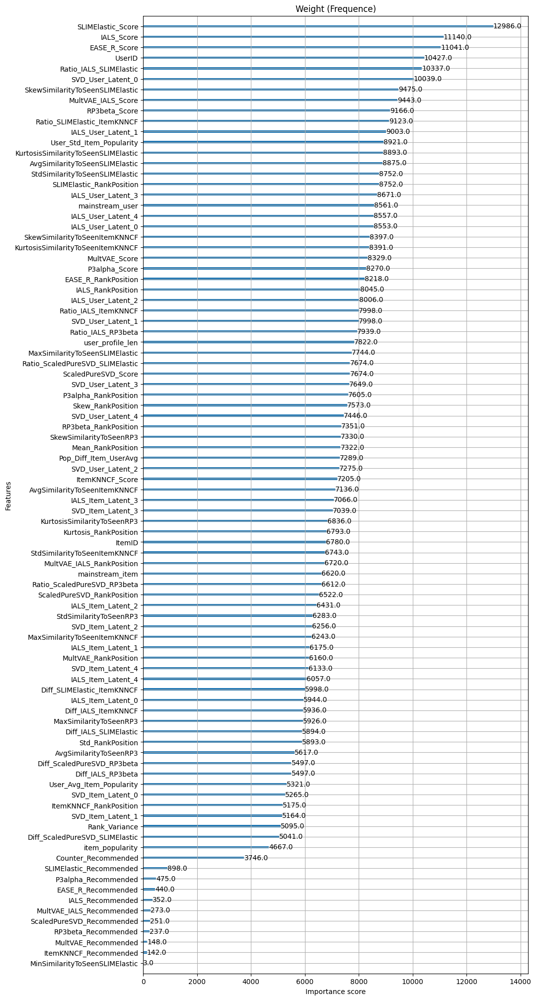

                                Feature  Importance
8                     SLIMElastic_Score     12986.0
5                            IALS_Score     11140.0
11                         EASE_R_Score     11041.0
0                                UserID     10427.0
78               Ratio_IALS_SLIMElastic     10337.0
68                    SVD_User_Latent_0     10039.0
33      SkewSimilarityToSeenSLIMElastic      9475.0
26                   MultVAE_IALS_Score      9443.0
14                        RP3beta_Score      9166.0
88          Ratio_SLIMElastic_ItemKNNCF      9123.0
55                   IALS_User_Latent_1      9003.0
66             User_Std_Item_Popularity      8921.0
34  KurtosisSimilarityToSeenSLIMElastic      8893.0
29       AvgSimilarityToSeenSLIMElastic      8875.0
9              SLIMElastic_RankPosition      8752.0
32       StdSimilarityToSeenSLIMElastic      8752.0
57                   IALS_User_Latent_3      8671.0
52                      mainstream_user      8561.0
58          

[I 2025-12-31 06:10:40,381] Trial 29 finished with value: 0.29044274867784386 and parameters: {'n_estimators': 2725, 'learning_rate': 0.002451140448469785, 'reg_alpha': 0.0021868607117104025, 'reg_lambda': 0.07645304732700693, 'max_depth': 8, 'max_leaves': 279, 'grow_policy': 'depthwise', 'gamma': 0.20321131641364432, 'min_child_weight': 0.0018388414831468436, 'subsample': 0.6863914916181414, 'colsample_bytree': 0.4255065776210374}. Best is trial 28 with value: 0.2908452650455368.


[06:10:49] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


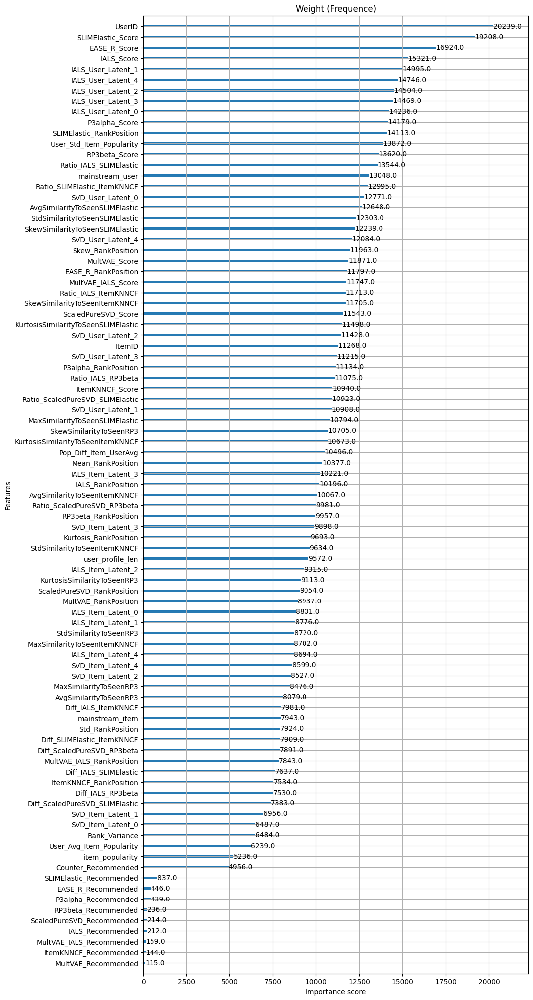

                                Feature  Importance
0                                UserID     20239.0
8                     SLIMElastic_Score     19208.0
11                         EASE_R_Score     16924.0
5                            IALS_Score     15321.0
54                   IALS_User_Latent_1     14995.0
57                   IALS_User_Latent_4     14746.0
55                   IALS_User_Latent_2     14504.0
56                   IALS_User_Latent_3     14469.0
53                   IALS_User_Latent_0     14236.0
17                        P3alpha_Score     14179.0
9              SLIMElastic_RankPosition     14113.0
65             User_Std_Item_Popularity     13872.0
14                        RP3beta_Score     13620.0
77               Ratio_IALS_SLIMElastic     13544.0
51                      mainstream_user     13048.0
87          Ratio_SLIMElastic_ItemKNNCF     12995.0
67                    SVD_User_Latent_0     12771.0
29       AvgSimilarityToSeenSLIMElastic     12648.0
31       Std

[I 2025-12-31 06:48:25,717] Trial 30 finished with value: 0.2902880367025005 and parameters: {'n_estimators': 4410, 'learning_rate': 0.00397638914537971, 'reg_alpha': 0.006503559927377462, 'reg_lambda': 0.0012694718431157607, 'max_depth': 8, 'max_leaves': 332, 'grow_policy': 'depthwise', 'gamma': 0.10270481643741151, 'min_child_weight': 8.45472988452152e-07, 'subsample': 0.6920958479238972, 'colsample_bytree': 0.5548645064214218}. Best is trial 28 with value: 0.2908452650455368.


[06:48:35] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


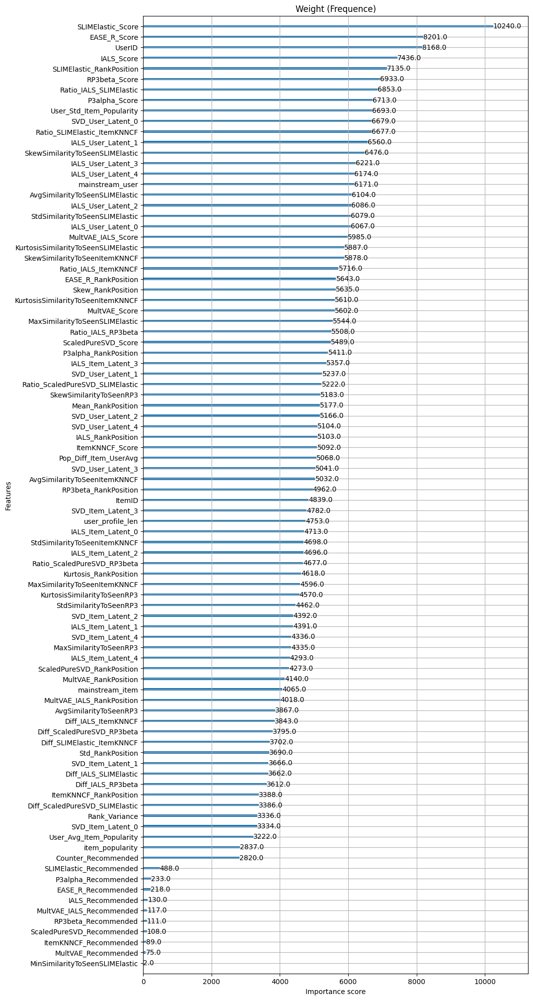

                                Feature  Importance
8                     SLIMElastic_Score     10240.0
11                         EASE_R_Score      8201.0
0                                UserID      8168.0
5                            IALS_Score      7436.0
9              SLIMElastic_RankPosition      7135.0
14                        RP3beta_Score      6933.0
78               Ratio_IALS_SLIMElastic      6853.0
17                        P3alpha_Score      6713.0
66             User_Std_Item_Popularity      6693.0
68                    SVD_User_Latent_0      6679.0
88          Ratio_SLIMElastic_ItemKNNCF      6677.0
55                   IALS_User_Latent_1      6560.0
33      SkewSimilarityToSeenSLIMElastic      6476.0
57                   IALS_User_Latent_3      6221.0
58                   IALS_User_Latent_4      6174.0
52                      mainstream_user      6171.0
29       AvgSimilarityToSeenSLIMElastic      6104.0
56                   IALS_User_Latent_2      6086.0
32       Std

[I 2025-12-31 07:17:47,731] Trial 31 finished with value: 0.29057579253277344 and parameters: {'n_estimators': 3684, 'learning_rate': 0.004298829811359496, 'reg_alpha': 0.0008097102042093556, 'reg_lambda': 7.83969481675017e-05, 'max_depth': 7, 'max_leaves': 373, 'grow_policy': 'depthwise', 'gamma': 0.14816602358845427, 'min_child_weight': 0.00025314882027326383, 'subsample': 0.6183172834924436, 'colsample_bytree': 0.522272476344387}. Best is trial 28 with value: 0.2908452650455368.


[07:17:57] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


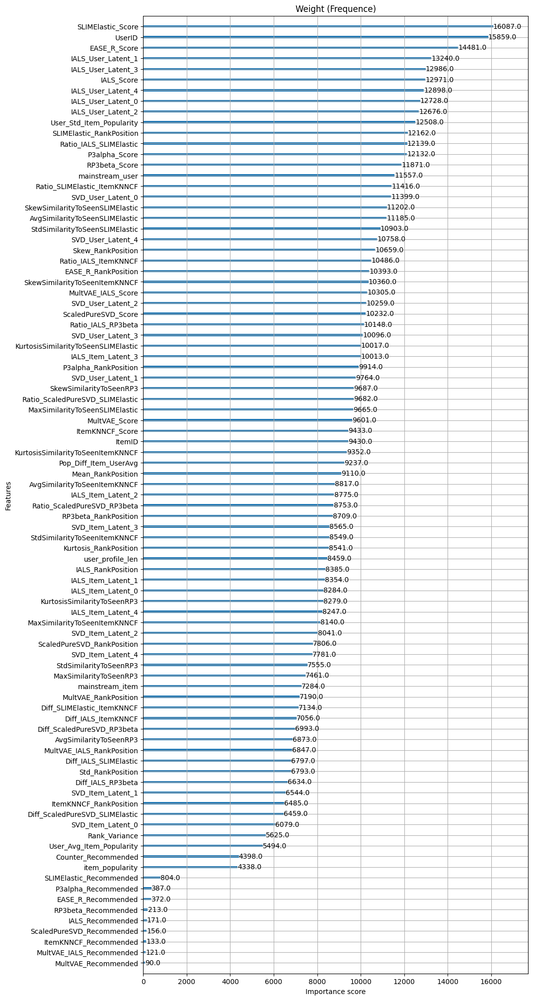

                                Feature  Importance
8                     SLIMElastic_Score     16087.0
0                                UserID     15859.0
11                         EASE_R_Score     14481.0
54                   IALS_User_Latent_1     13240.0
56                   IALS_User_Latent_3     12986.0
5                            IALS_Score     12971.0
57                   IALS_User_Latent_4     12898.0
53                   IALS_User_Latent_0     12728.0
55                   IALS_User_Latent_2     12676.0
65             User_Std_Item_Popularity     12508.0
9              SLIMElastic_RankPosition     12162.0
77               Ratio_IALS_SLIMElastic     12139.0
17                        P3alpha_Score     12132.0
14                        RP3beta_Score     11871.0
51                      mainstream_user     11557.0
87          Ratio_SLIMElastic_ItemKNNCF     11416.0
67                    SVD_User_Latent_0     11399.0
32      SkewSimilarityToSeenSLIMElastic     11202.0
29       Avg

[I 2025-12-31 07:51:53,778] Trial 32 finished with value: 0.29095067180729 and parameters: {'n_estimators': 3856, 'learning_rate': 0.0037828131928273946, 'reg_alpha': 0.004584655672487615, 'reg_lambda': 8.502668039397065e-05, 'max_depth': 8, 'max_leaves': 275, 'grow_policy': 'depthwise', 'gamma': 0.4455089367501048, 'min_child_weight': 0.0007727813347082213, 'subsample': 0.5643685503269545, 'colsample_bytree': 0.579542218984989}. Best is trial 32 with value: 0.29095067180729.


[07:52:03] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


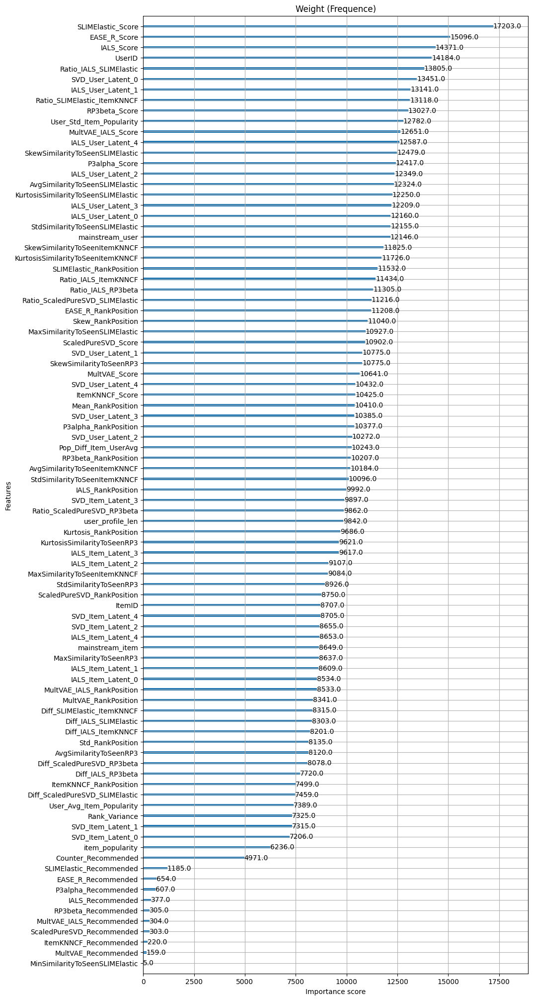

                                Feature  Importance
8                     SLIMElastic_Score     17203.0
11                         EASE_R_Score     15096.0
5                            IALS_Score     14371.0
0                                UserID     14184.0
78               Ratio_IALS_SLIMElastic     13805.0
68                    SVD_User_Latent_0     13451.0
55                   IALS_User_Latent_1     13141.0
88          Ratio_SLIMElastic_ItemKNNCF     13118.0
14                        RP3beta_Score     13027.0
66             User_Std_Item_Popularity     12782.0
26                   MultVAE_IALS_Score     12651.0
58                   IALS_User_Latent_4     12587.0
33      SkewSimilarityToSeenSLIMElastic     12479.0
17                        P3alpha_Score     12417.0
56                   IALS_User_Latent_2     12349.0
29       AvgSimilarityToSeenSLIMElastic     12324.0
34  KurtosisSimilarityToSeenSLIMElastic     12250.0
57                   IALS_User_Latent_3     12209.0
54          

[I 2025-12-31 08:30:46,124] Trial 33 finished with value: 0.29084018592632066 and parameters: {'n_estimators': 4325, 'learning_rate': 0.002782828804966137, 'reg_alpha': 0.00031720531952745065, 'reg_lambda': 0.0003215220229664369, 'max_depth': 8, 'max_leaves': 207, 'grow_policy': 'depthwise', 'gamma': 0.7786817647948377, 'min_child_weight': 0.0009346371588114704, 'subsample': 0.764939468292693, 'colsample_bytree': 0.41487704579640716}. Best is trial 32 with value: 0.29095067180729.


[08:30:55] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


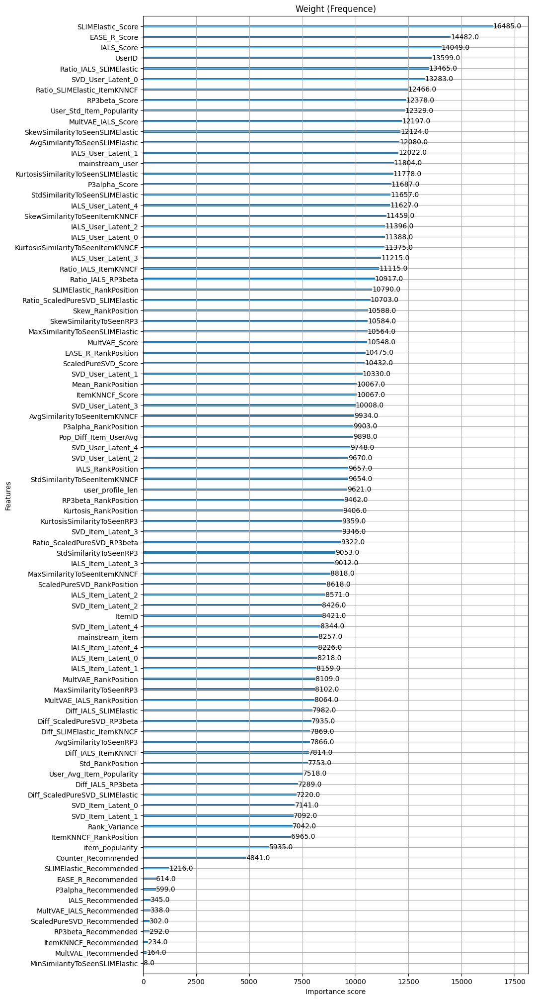

                                Feature  Importance
8                     SLIMElastic_Score     16485.0
11                         EASE_R_Score     14482.0
5                            IALS_Score     14049.0
0                                UserID     13599.0
78               Ratio_IALS_SLIMElastic     13465.0
68                    SVD_User_Latent_0     13283.0
88          Ratio_SLIMElastic_ItemKNNCF     12466.0
14                        RP3beta_Score     12378.0
66             User_Std_Item_Popularity     12329.0
26                   MultVAE_IALS_Score     12197.0
33      SkewSimilarityToSeenSLIMElastic     12124.0
29       AvgSimilarityToSeenSLIMElastic     12080.0
55                   IALS_User_Latent_1     12022.0
52                      mainstream_user     11804.0
34  KurtosisSimilarityToSeenSLIMElastic     11778.0
17                        P3alpha_Score     11687.0
32       StdSimilarityToSeenSLIMElastic     11657.0
58                   IALS_User_Latent_4     11627.0
43        Sk

[I 2025-12-31 09:08:59,162] Trial 34 finished with value: 0.2907504020134111 and parameters: {'n_estimators': 4251, 'learning_rate': 0.002762624769386, 'reg_alpha': 0.00028724376337322874, 'reg_lambda': 0.0002449989791782156, 'max_depth': 8, 'max_leaves': 191, 'grow_policy': 'lossguide', 'gamma': 0.2430862355052778, 'min_child_weight': 0.0009399587063783691, 'subsample': 0.7619051502895146, 'colsample_bytree': 0.3993676700457788}. Best is trial 32 with value: 0.29095067180729.


[09:09:08] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


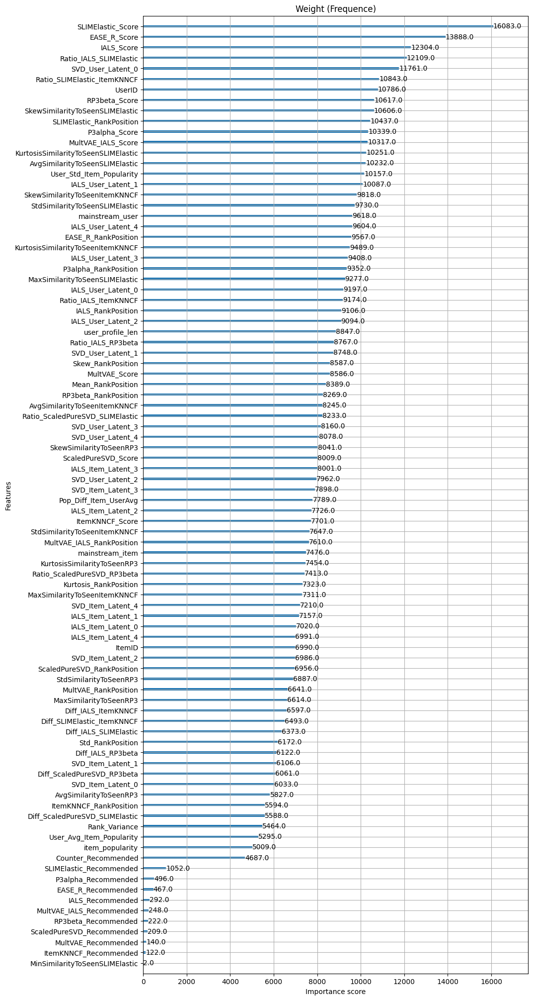

                                Feature  Importance
8                     SLIMElastic_Score     16083.0
11                         EASE_R_Score     13888.0
5                            IALS_Score     12304.0
78               Ratio_IALS_SLIMElastic     12109.0
68                    SVD_User_Latent_0     11761.0
88          Ratio_SLIMElastic_ItemKNNCF     10843.0
0                                UserID     10786.0
14                        RP3beta_Score     10617.0
33      SkewSimilarityToSeenSLIMElastic     10606.0
9              SLIMElastic_RankPosition     10437.0
17                        P3alpha_Score     10339.0
26                   MultVAE_IALS_Score     10317.0
34  KurtosisSimilarityToSeenSLIMElastic     10251.0
29       AvgSimilarityToSeenSLIMElastic     10232.0
66             User_Std_Item_Popularity     10157.0
55                   IALS_User_Latent_1     10087.0
43        SkewSimilarityToSeenItemKNNCF      9818.0
32       StdSimilarityToSeenSLIMElastic      9730.0
52          

[I 2025-12-31 09:41:28,757] Trial 35 finished with value: 0.2904178541411262 and parameters: {'n_estimators': 3158, 'learning_rate': 0.001824445900145466, 'reg_alpha': 0.0001256649254451716, 'reg_lambda': 0.0009497372856794429, 'max_depth': 8, 'max_leaves': 297, 'grow_policy': 'depthwise', 'gamma': 0.8193159003165706, 'min_child_weight': 0.018832309551521237, 'subsample': 0.7584351623435673, 'colsample_bytree': 0.5082637704403798}. Best is trial 32 with value: 0.29095067180729.


[09:41:40] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


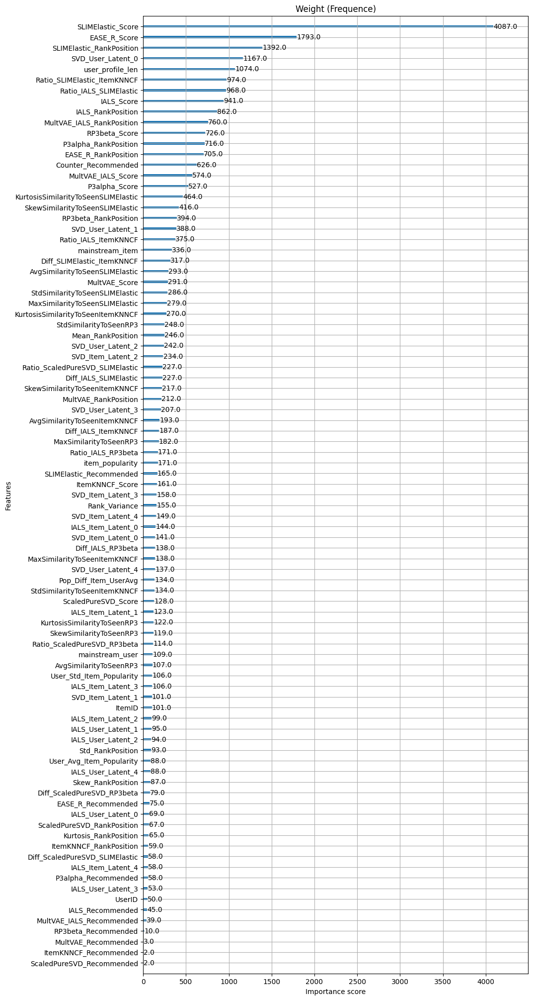

                                Feature  Importance
8                     SLIMElastic_Score      4087.0
11                         EASE_R_Score      1793.0
9              SLIMElastic_RankPosition      1392.0
67                    SVD_User_Latent_0      1167.0
50                     user_profile_len      1074.0
87          Ratio_SLIMElastic_ItemKNNCF       974.0
77               Ratio_IALS_SLIMElastic       968.0
5                            IALS_Score       941.0
6                     IALS_RankPosition       862.0
27            MultVAE_IALS_RankPosition       760.0
14                        RP3beta_Score       726.0
18                 P3alpha_RankPosition       716.0
12                  EASE_R_RankPosition       705.0
44                  Counter_Recommended       626.0
26                   MultVAE_IALS_Score       574.0
17                        P3alpha_Score       527.0
33  KurtosisSimilarityToSeenSLIMElastic       464.0
32      SkewSimilarityToSeenSLIMElastic       416.0
15          

[I 2025-12-31 10:08:00,212] Trial 36 finished with value: 0.2888695900543172 and parameters: {'n_estimators': 4603, 'learning_rate': 0.0024834101729425727, 'reg_alpha': 0.0005971596926107503, 'reg_lambda': 0.0004663288987655885, 'max_depth': 8, 'max_leaves': 235, 'grow_policy': 'depthwise', 'gamma': 10.59277851586298, 'min_child_weight': 0.10397351463424635, 'subsample': 0.8206117447508855, 'colsample_bytree': 0.4389763103991733}. Best is trial 32 with value: 0.29095067180729.


[10:08:09] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


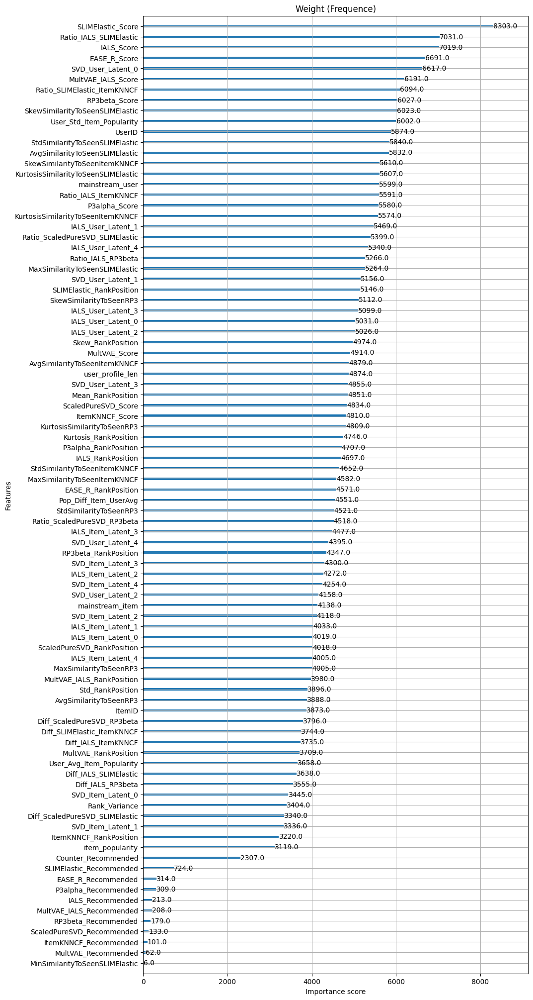

                                Feature  Importance
8                     SLIMElastic_Score      8303.0
78               Ratio_IALS_SLIMElastic      7031.0
5                            IALS_Score      7019.0
11                         EASE_R_Score      6691.0
68                    SVD_User_Latent_0      6617.0
26                   MultVAE_IALS_Score      6191.0
88          Ratio_SLIMElastic_ItemKNNCF      6094.0
14                        RP3beta_Score      6027.0
33      SkewSimilarityToSeenSLIMElastic      6023.0
66             User_Std_Item_Popularity      6002.0
0                                UserID      5874.0
32       StdSimilarityToSeenSLIMElastic      5840.0
29       AvgSimilarityToSeenSLIMElastic      5832.0
43        SkewSimilarityToSeenItemKNNCF      5610.0
34  KurtosisSimilarityToSeenSLIMElastic      5607.0
52                      mainstream_user      5599.0
86                 Ratio_IALS_ItemKNNCF      5591.0
17                        P3alpha_Score      5580.0
44    Kurtos

[I 2025-12-31 10:32:13,980] Trial 37 finished with value: 0.29080346211721114 and parameters: {'n_estimators': 2562, 'learning_rate': 0.003981911978135057, 'reg_alpha': 0.001164853612723219, 'reg_lambda': 0.0026739494377802206, 'max_depth': 8, 'max_leaves': 151, 'grow_policy': 'lossguide', 'gamma': 0.4591801255344778, 'min_child_weight': 0.011096297427594574, 'subsample': 0.6548062696717497, 'colsample_bytree': 0.3770031352440172}. Best is trial 32 with value: 0.29095067180729.


[10:32:23] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


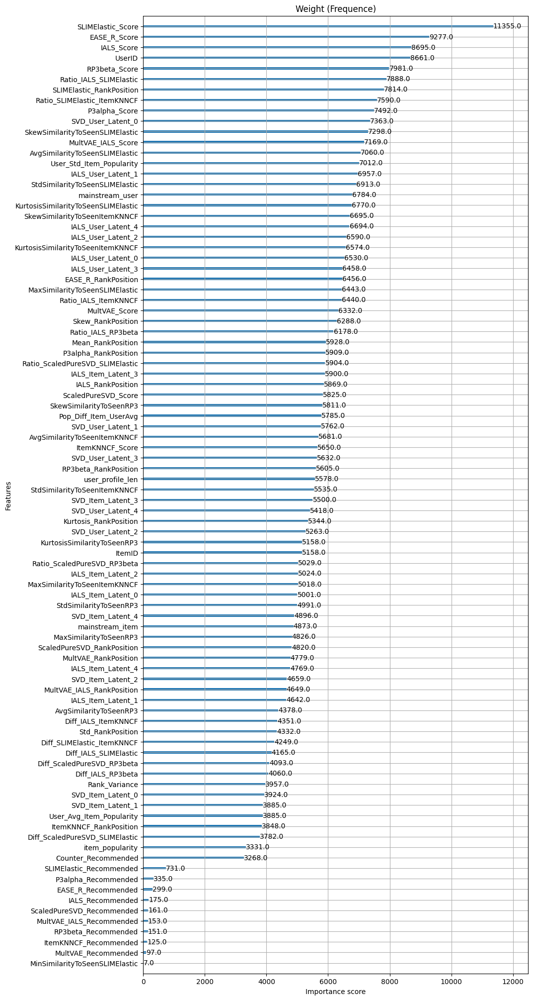

                                Feature  Importance
8                     SLIMElastic_Score     11355.0
11                         EASE_R_Score      9277.0
5                            IALS_Score      8695.0
0                                UserID      8661.0
14                        RP3beta_Score      7981.0
78               Ratio_IALS_SLIMElastic      7888.0
9              SLIMElastic_RankPosition      7814.0
88          Ratio_SLIMElastic_ItemKNNCF      7590.0
17                        P3alpha_Score      7492.0
68                    SVD_User_Latent_0      7363.0
33      SkewSimilarityToSeenSLIMElastic      7298.0
26                   MultVAE_IALS_Score      7169.0
29       AvgSimilarityToSeenSLIMElastic      7060.0
66             User_Std_Item_Popularity      7012.0
55                   IALS_User_Latent_1      6957.0
32       StdSimilarityToSeenSLIMElastic      6913.0
52                      mainstream_user      6784.0
34  KurtosisSimilarityToSeenSLIMElastic      6770.0
43        Sk

[I 2025-12-31 11:05:07,003] Trial 38 finished with value: 0.2905603504970582 and parameters: {'n_estimators': 4084, 'learning_rate': 0.0035100325426415816, 'reg_alpha': 0.0002512051980824061, 'reg_lambda': 0.00013644839893370582, 'max_depth': 7, 'max_leaves': 262, 'grow_policy': 'depthwise', 'gamma': 0.1231545179981572, 'min_child_weight': 0.0014218427794225074, 'subsample': 0.7213241921216281, 'colsample_bytree': 0.4736696756575577}. Best is trial 32 with value: 0.29095067180729.


[11:05:16] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


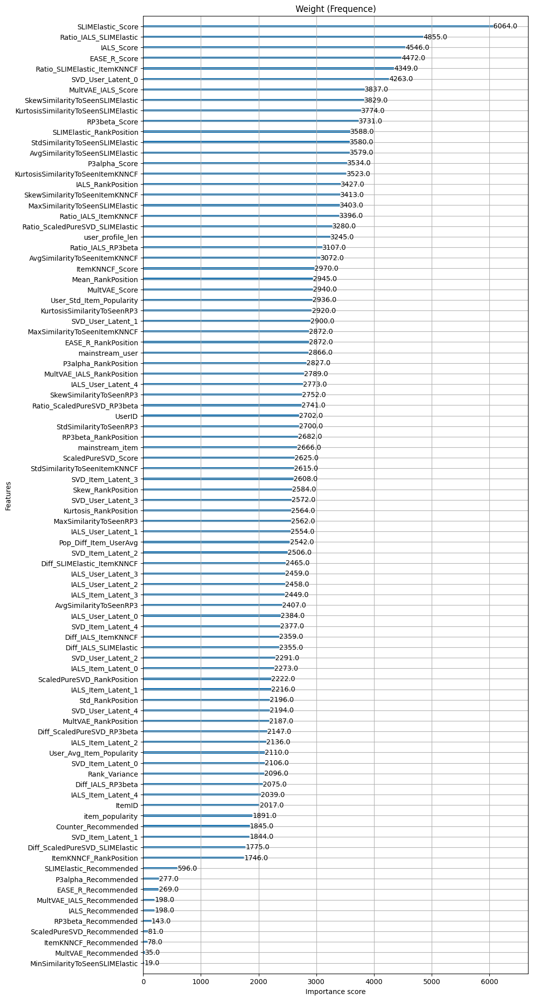

                                Feature  Importance
8                     SLIMElastic_Score      6064.0
78               Ratio_IALS_SLIMElastic      4855.0
5                            IALS_Score      4546.0
11                         EASE_R_Score      4472.0
88          Ratio_SLIMElastic_ItemKNNCF      4349.0
68                    SVD_User_Latent_0      4263.0
26                   MultVAE_IALS_Score      3837.0
33      SkewSimilarityToSeenSLIMElastic      3829.0
34  KurtosisSimilarityToSeenSLIMElastic      3774.0
14                        RP3beta_Score      3731.0
9              SLIMElastic_RankPosition      3588.0
32       StdSimilarityToSeenSLIMElastic      3580.0
29       AvgSimilarityToSeenSLIMElastic      3579.0
17                        P3alpha_Score      3534.0
44    KurtosisSimilarityToSeenItemKNNCF      3523.0
6                     IALS_RankPosition      3427.0
43        SkewSimilarityToSeenItemKNNCF      3413.0
30       MaxSimilarityToSeenSLIMElastic      3403.0
86          

[I 2025-12-31 11:26:57,723] Trial 39 finished with value: 0.2901694749599731 and parameters: {'n_estimators': 2252, 'learning_rate': 0.0031643696815444318, 'reg_alpha': 4.053345678008923e-05, 'reg_lambda': 0.00032590206508504606, 'max_depth': 8, 'max_leaves': 103, 'grow_policy': 'lossguide', 'gamma': 2.4012400464452255, 'min_child_weight': 0.11489465236965064, 'subsample': 0.898551890125683, 'colsample_bytree': 0.32224212917191253}. Best is trial 32 with value: 0.29095067180729.


[11:27:08] INFO: /Users/runner/work/xgboost/xgboost/src/data/iterative_dmatrix.cc:56: Finished constructing the `IterativeDMatrix`: (1354750, 92, 123739478).


[W 2025-12-31 11:34:02,772] Trial 40 failed with parameters: {'n_estimators': 4674, 'learning_rate': 0.0014004375485082154, 'reg_alpha': 0.0030175021774569827, 'reg_lambda': 0.0008941997325780369, 'max_depth': 3, 'max_leaves': 217, 'grow_policy': 'depthwise', 'gamma': 0.25757385426201046, 'min_child_weight': 1.4970367005614305e-05, 'subsample': 0.5498452770423172, 'colsample_bytree': 0.5903316670512584} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/optuna/study/_optimize.py", line 205, in _run_trial
    value_or_values = func(trial)
  File "/var/folders/wp/jydg89697jzcwnllv2_yz6d40000gn/T/ipykernel_11730/3471911664.py", line 23, in objective_xgboost
    XGB_model.fit(
    ~~~~~~~~~~~~~^
        X_train,
        ^^^^^^^^
    ...<2 lines>...
        verbose=True
        ^^^^^^^^^^^^
    )
    ^
  File "/Library/Frameworks/Python.framework/Versions/3.13/lib/pyt

KeyboardInterrupt: 

In [29]:
study = optuna.create_study(direction='maximize', study_name='xgboost_tuning_fixed_more_recommenders_more_candidates')
study.optimize(objective_xgboost, n_trials=50)

# Parametri finali xgboost

In [ ]:
XGBoost_Parameters = {    
    'objective': 'rank:map', 
    'n_estimators': 4311, 
    'learning_rate': 0.007651019829692804, 
    'reg_alpha': 0.00046969890359217103, 
    'reg_lambda': 0.00036892979762148984, 
    'max_depth': 5, 
    'max_leaves': 72, 
    'grow_policy': 'depthwise', 
    'gamma': 0.35323759745948785, 
    'min_child_weight': 2.0095902489610272e-05, 
    'subsample': 0.36462843836663134, 
    'colsample_bytree': 0.3338747645086767
}

# Creazione final_train_dataframe

In [ ]:
final_train_dataframe = feature_populator(URM_train_validation, linear_comb_rec_f, other_algorithms_f, cutoff = 50)

In [ ]:
URM_test_coo = sps.coo_matrix(URM_test)

correct_recommendations_all = pd.DataFrame({"UserID": URM_test_coo.row,
                                        "ItemID": URM_test_coo.col})
correct_recommendations_all

In [ ]:
final_train_dataframe = pd.merge(final_train_dataframe, correct_recommendations_all, on=['UserID','ItemID'], how='left', indicator='Exist')
final_train_dataframe["Label"] = final_train_dataframe["Exist"] == "both"
final_train_dataframe.drop(columns = ['Exist'], inplace=True)
final_train_dataframe

# Training finale XGBoost

In [ ]:
groups = final_train_dataframe.groupby("UserID").size().values
groups

In [ ]:
from xgboost import XGBRanker
XGB_model_f = XGBRanker(**XGBoost_Parameters)

y_train = final_train_dataframe["Label"]
X_train = final_train_dataframe.drop(columns=["Label"])
X_train["UserID"] = X_train["UserID"].astype(int)
X_train["ItemID"] = X_train["ItemID"].astype(int)

print(np.isinf(X_train).sum())  # Count of infinite values in training data


# Check for NaN values
print(np.isnan(X_train).sum())  # Count of NaN values in training data

X_train = np.nan_to_num(X_train, posinf=np.finfo(np.float32).max, neginf=0.0)



XGB_model_f.fit(
    X_train,
    y_train,
    group=groups,
    verbose=True
)

In [ ]:
%matplotlib inline
from xgboost import plot_importance

import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10, 25))
plot_importance(XGB_model_f, importance_type='weight', title='Weight (Frequence)', max_num_features=100, ax=ax)
plt.show()

import pandas as pd
try:
    importance_dict = XGB_model_f.get_score(importance_type='weight')
except AttributeError:
    importance_dict = XGB_model_f.get_booster().get_score(importance_type='weight')
importance_df = pd.DataFrame({
    'Feature': list(importance_dict.keys()),
    'Importance': list(importance_dict.values())
}).sort_values(by='Importance', ascending=False)
with pd.option_context('display.max_rows', None):
    print(importance_df)

# Training modelli con URM_all

In [ ]:
other_algorithms_all = {}

# Loop per trainare e valutare tutti i modelli
for model_class, params, name in models_to_train:
    print(f"--- Training {name} ---")
    
    current_recommender = model_class(URM_all)
    current_recommender.fit(**params)
    
    other_algorithms_all[name] = current_recommender
    
    print(f"Modello salvato in: other_algorithms_all['{name}']\n")

other_algorithms_all['MultVAE_IALS'] = NormalizedLinearCoupleHybridRecommender(
    URM_train, 
    [other_algorithms_all['MultVAE'], other_algorithms_all['IALS']]
)
other_algorithms_all['MultVAE_IALS'].fit(alpha=0.2133024147200015)

other_algorithms_all

In [ ]:
linear_comb_rec_all = TripleIntegratedHierarchicalHybridRecommender(
    URM_all,
    other_algorithms_all['SLIMElastic'],
    other_algorithms_all['EASE_R'],
    other_algorithms_all['RP3beta'],
    #other_algorithms_all['IALS']
    other_algorithms_all['MultVAE_IALS']
    )
linear_comb_rec_all.fit(best_alpha, best_beta, best_gamma)

# Creazione prediction_dataframe

In [ ]:
prediction_dataframe = feature_populator(URM_all, linear_comb_rec_all, other_algorithms_all, cutoff = 50)
prediction_dataframe

# Run finale XGBoostRerankerRecommender + submission

In [ ]:
prediction_dataframe["UserID"] = prediction_dataframe["UserID"].astype(int)
prediction_dataframe["ItemID"] = prediction_dataframe["ItemID"].astype(int)

In [ ]:
recommender = XGBoostRerankerRecommender(URM_all, XGB_model_f, prediction_dataframe)

In [ ]:
import time

start_time = time.time()
results = []
for user_id in df_test_user["user_id"].tolist():
        recommendations = recommender.recommend([user_id], cutoff=20)       
       
        results.append((user_id, ' '.join(map(str, recommendations[0][0]))))

df_recommendations = pd.DataFrame(results, columns=["user_id", "item_list"])
print(df_recommendations)
df_recommendations.to_csv("recommendations_xgboost_30122025.csv", index=False)

end_time = time.time()